In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split  # Optional, if splitting manually not used
from sklearn.metrics import (mean_squared_error,mean_absolute_error,mean_absolute_percentage_error,r2_score)
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Dense, Dropout, Embedding, Flatten, Concatenate, BatchNormalization)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import os 
import random

In [4]:
def set_seed(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)        
    random.seed(seed)                               
    np.random.seed(seed)                            
    tf.random.set_seed(seed)                        

set_seed(42)

# Overnights 2024 LR=0.001 Model 3

In [232]:
# Load and clean data
cool = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/df_top_cool.csv")
cool.replace('..', np.nan, inplace=True)
cool['date'] = pd.to_datetime(cool[['year', 'month']].assign(day=1))
lag_cols = [col for col in cool.columns if 'lag' in col]
cool = cool.drop(columns=lag_cols, errors='ignore')
cool = cool[~cool['country'].isin(['Russian Federation'])]

In [233]:
# Convert types
cool['year'] = pd.to_numeric(cool['year'], downcast='integer', errors='coerce')
cool['month'] = pd.to_numeric(cool['month'], downcast='integer', errors='coerce')
cool['arrivals'] = pd.to_numeric(cool['arrivals'], errors='coerce')
cool['overnights'] = pd.to_numeric(cool['overnights'], errors='coerce')
cool['unemployment_rate'] = pd.to_numeric(cool['unemployment_rate'], errors='coerce')
cool['exchange_rate'] = pd.to_numeric(cool['exchange_rate'], errors='coerce')
cool['cpi'] = pd.to_numeric(cool['cpi'], errors='coerce')
cool['eu_member'] = cool['eu_member'].astype(int)
cool['euro_adopted'] = cool['euro_adopted'].astype(int)

# Merge Google Trends data
td = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/multiTimeline.csv")
cool['date'] = pd.to_datetime(cool['date']).dt.to_period('M').dt.to_timestamp()
td['date'] = pd.to_datetime(td['date']).dt.to_period('M').dt.to_timestamp()
td_long = td.melt(id_vars='date', var_name='country', value_name='google_trends')
cool = cool.merge(td_long, on=['date', 'country'], how='left')
cool['google_trends'] = cool['google_trends'].fillna(-1)

# Sort and log-transform
cool = cool.sort_values(['country', 'date']).reset_index(drop=True)
cool = cool.drop_duplicates(subset=['country', 'date'], keep='first').reset_index(drop=True)
cool['arrivals'] = np.log1p(cool['arrivals']) 
cool['overnights'] = np.log1p(cool['overnights'])
cool['exchange_rate'] = np.log1p(cool['exchange_rate'])
cool['cpi'] = np.log1p(cool['cpi'])
cool['overnights_next_month'] = cool.groupby('country')['overnights'].shift(-1)

# One-hot encode month
month_names = {i: month for i, month in enumerate(['January','February','March','April','May','June','July','August','September','October','November','December'], 1)}
cool['month_name'] = cool['month'].map(month_names)
ohe_month = pd.get_dummies(cool['month_name'], prefix='month').astype(int)
cool = pd.concat([cool, ohe_month], axis=1).drop(columns=['month_name'])

# Create lags
lags = {'arrivals': [1, 3, 6, 12], 'overnights': [1, 3, 6, 12], 'cpi': [1], 'unemployment_rate': [3], 'google_trends': [1, 3]}
for var, steps in lags.items():
    for lag in steps:
        cool[f'{var}_lag_{lag}'] = cool.groupby('country')[var].shift(lag)

cool
# Step 1: Define Schengen entry years
schengen_entry_year = {
    'Austria': 1995,
    'Belgium': 1995,
    'Czech Republic': 2007,
    'Denmark': 2001,
    'Finland': 1996,
    'France': 1995,
    'Germany': 1995,
    'Hungary': 2007,
    'Italy': 1997,
    'Netherlands': 1995,
    'Norway': 2001,
    'Poland': 2007,
    'Portugal': 1995,
    'Slovakia': 2007,
    'Slovenia': 2007,
    'Spain': 1995,
    'Sweden': 2001,
    'Switzerland': 2008,
    'Romania': 2024,}

def is_schengen_member(row):
    entry_year = schengen_entry_year.get(row['country'], np.inf)
    return int(row['year'] >= entry_year)

cool['schengen_member'] = cool.apply(is_schengen_member, axis=1).astype('int8')

# Filter and drop missing
cool.isna().sum().sort_values(ascending=False) 
cool = cool[cool['date'] >= '2001-01-01']
cool = cool[cool['overnights_next_month'].notna()].copy()

In [234]:
# Label encode country and scale numeric features
cool['country_encoded'] = LabelEncoder().fit_transform(cool['country'])
month_cols = [col for col in cool.columns if col.startswith('month_')]
X_numeric = cool[[
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'overnights_lag_1', 'overnights_lag_3', 'overnights_lag_6', 'overnights_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member','euro_adopted'] + month_cols].values
X_country_array = cool['country_encoded'].astype('int32').values
y = cool['overnights_next_month'].values

In [235]:
# Time-based split
train_end = pd.Timestamp("2016-12-31")
val_end = pd.Timestamp("2020-12-31")
train_mask = cool['date'] <= train_end
val_mask = (cool['date'] > train_end) & (cool['date'] <= val_end)
test_mask = cool['date'] > val_end

scaler = StandardScaler()
X_num_train = scaler.fit_transform(X_numeric[train_mask])
X_num_val = scaler.transform(X_numeric[val_mask])
X_num_test = scaler.transform(X_numeric[test_mask])
X_numeric_scaled_all = scaler.transform(X_numeric)  

X_cat_train = X_country_array[train_mask.to_numpy()]
X_cat_val = X_country_array[val_mask.to_numpy()]
X_cat_test = X_country_array[test_mask.to_numpy()]
y_train = y[train_mask.to_numpy()]
y_val = y[val_mask.to_numpy()]
y_test = y[test_mask.to_numpy()]

# Define model3
input_numeric = Input(shape=(X_num_train.shape[1],), name="numeric_input")
input_country = Input(shape=(1,), dtype='int32', name="country_input")
n_countries = cool['country_encoded'].nunique()
embedding = Embedding(input_dim=n_countries, output_dim=10)(input_country)
embedding_flat = Flatten()(embedding)
x = Concatenate()([input_numeric, embedding_flat])
x = Dense(64, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
x = Dense(32, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
output = Dense(1)(x)
model3 = Model(inputs=[input_numeric, input_country], outputs=output)
model3.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
model3.summary()

# Train model3
early_stop = EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=True)
history = model3.fit(
    [X_num_train, X_cat_train], y_train,
    validation_data=([X_num_val, X_cat_val], y_val),
    epochs=100, batch_size=16, callbacks=[early_stop]
)

Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ country_input       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_26        │ (None, 1, 10)     │        230 │ country_input[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ numeric_input       │ (None, 25)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_26          │ (None, 10)        │          0 │ embedding_26[0][… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_26      │ (None, 35)        │          0 │ numeric_input[0]… │
│ (Concatenate)       │                   │            │ flatten_26[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_78 (Dense)    │ (None, 64)        │      2,304 │ concatenate_26[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_78[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_52          │ (None, 64)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_79 (Dense)    │ (None, 32)        │      2,080 │ dropout_52[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_79[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_53          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_80 (Dense)    │ (None, 1)         │         33 │ dropout_53[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,031 (19.65 KB)

 Trainable params: 4,839 (18.90 KB)

 Non-trainable params: 192 (768.00 B)

Epoch 1/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 28s 11ms/step - loss: 89.2403 - val_loss: 35.5990
Epoch 2/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 24.8093 - val_loss: 2.2839
Epoch 3/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 4.6342 - val_loss: 1.7292
Epoch 4/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3.3075 - val_loss: 1.7541
Epoch 5/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.9630 - val_loss: 1.6112
Epoch 6/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.7032 - val_loss: 1.5946
Epoch 7/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.4437 - val_loss: 1.5346
Epoch 8/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 2.0947 - val_loss: 1.5173
Epoch 9/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 1.9937 - val_loss: 1.5489
Epoch 10/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 1.8901 - val_loss: 1.5497
Epoch 11/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 1.7351 - val_loss: 1.6645
Epoch 12/100
276/276 ━━━━━━━━━━━━

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━

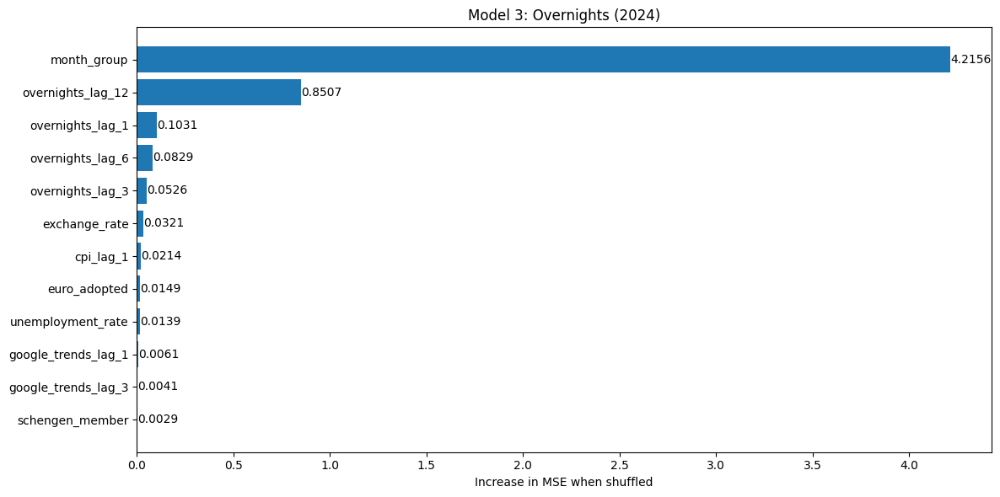

In [236]:
# Baseline predictions
baseline_preds = model3.predict([X_num_test, X_cat_test]).flatten()
baseline_mse = mean_squared_error(y_test, baseline_preds)

feature_names = [
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'overnights_lag_1', 'overnights_lag_3', 'overnights_lag_6', 'overnights_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted']+month_cols

importances = []
for i in range(X_num_test.shape[1]):
    X_permuted = X_num_test.copy()
    X_permuted[:, i] = np.random.permutation(X_permuted[:, i])
    permuted_preds = model3.predict([X_permuted, X_cat_test]).flatten()
    permuted_mse = mean_squared_error(y_test, permuted_preds)
    importances.append(max(0, permuted_mse - baseline_mse))

#Handle grouped month dummies so its not one bar for each month
month_indices = [i for i, f in enumerate(feature_names) if f.startswith('month_')]

if month_indices:
    # Safe grouped permutation
    X_month_permuted = X_num_test.copy()
    row_perm = np.random.permutation(len(X_month_permuted))
    X_month_permuted[:, month_indices] = X_month_permuted[row_perm][:, month_indices]
    month_preds = model3.predict([X_month_permuted, X_cat_test]).flatten()
    month_importance = max(0, mean_squared_error(y_test, month_preds) - baseline_mse)
else:
    month_importance = 0  # fallback if no month cols present

filtered_names = [f for i, f in enumerate(feature_names) if i not in month_indices]
filtered_importances = [imp for i, imp in enumerate(importances) if i not in month_indices]
feature_names_final = filtered_names + ['month_group']
importances_final = filtered_importances + [month_importance]
sorted_pairs = sorted(zip(importances_final, feature_names_final), reverse=True)
importances_sorted, feature_names_sorted = zip(*sorted_pairs)

plt.figure(figsize=(12, 6))
bars = plt.barh(feature_names_sorted, importances_sorted)
plt.xlabel("Increase in MSE when shuffled")
plt.title("Model 3: Overnights (2024)")
plt.gca().invert_yaxis()

# Add labels
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.001, bar.get_y() + bar.get_height() / 2,
             f"{width:.4f}", va='center')

plt.tight_layout()
plt.show()

## Model Evaluation

138/138 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Train MSE: 0.0999, RMSE: 0.3161, MAE: 0.2388, MAPE: 0.0260, R²: 0.9798
Test MSE: 0.3100, RMSE: 0.5568, MAE: 0.4334, MAPE: 0.0432, R²: 0.9311


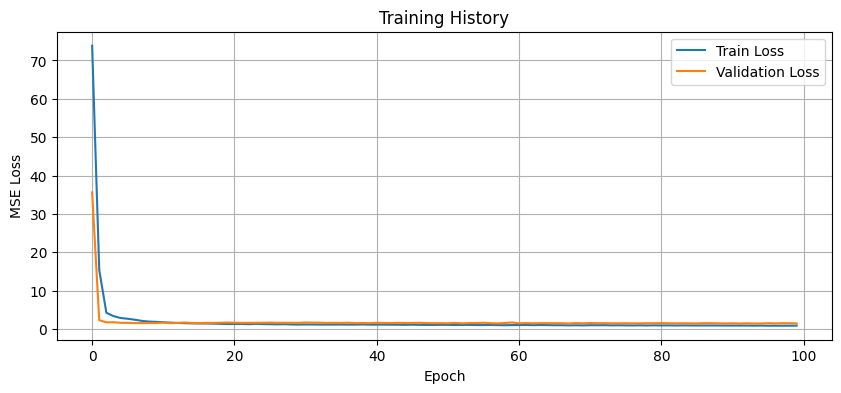

In [238]:
## Model evalauation
# Predict and flatten
train_preds = model3.predict([X_num_train, X_cat_train]).flatten()
test_preds = model3.predict([X_num_test, X_cat_test]).flatten()

# MSE
train_mse = mean_squared_error(y_train, train_preds)
test_mse = mean_squared_error(y_test, test_preds)

# RMSE
train_rmse3 = np.sqrt(train_mse)
test_rmse3 = np.sqrt(test_mse)

#MAE
train_mae3 = mean_absolute_error(y_train, train_preds)
test_mae3 = mean_absolute_error(y_test, test_preds)

# MAPE
train_mape3 = mean_absolute_percentage_error(y_train, train_preds)
test_mape3 = mean_absolute_percentage_error(y_test, test_preds)

# R-squared
train_r2_3 = r2_score(y_train, train_preds)
test_r2_3 = r2_score(y_test, test_preds)

# Print all metrics
print(f"Train MSE: {train_mse:.4f}, RMSE: {train_rmse3:.4f}, MAE: {train_mae3:.4f}, MAPE: {train_mape3:.4f}, R²: {train_r2_3:.4f}")
print(f"Test MSE: {test_mse:.4f}, RMSE: {test_rmse3:.4f}, MAE: {test_mae3:.4f}, MAPE: {test_mape3:.4f}, R²: {test_r2_3:.4f}")

# Plot training history
plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True)
plt.show()

207/207 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step


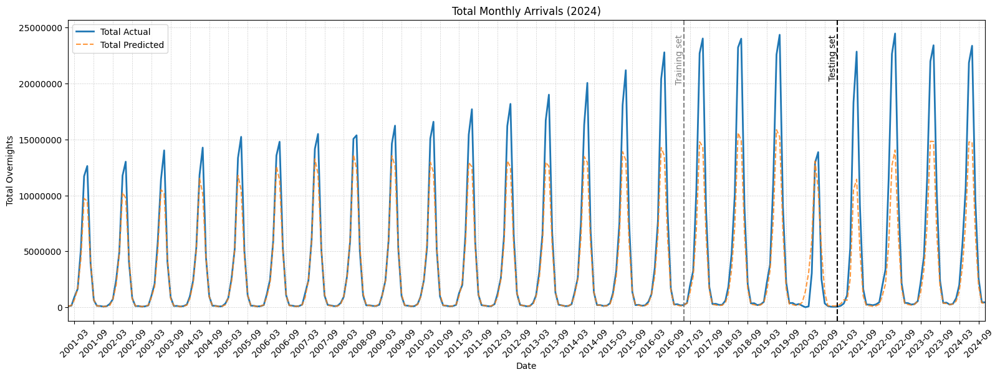

In [ ]:
y_pred_all = model3.predict([X_numeric_scaled_all, X_country_array]).flatten()
y_actual_all = np.expm1(y)
y_pred_all = np.expm1(y_pred_all)
df_plot = cool.copy()
df_plot['actual'] = y_actual_all
df_plot['predicted'] = y_pred_all
monthly_totals_all = df_plot.groupby('date')[['actual', 'predicted']].sum()

plt.figure(figsize=(16, 6))
plt.plot(monthly_totals_all.index, monthly_totals_all['actual'], label='Total Actual', linewidth=2)
plt.plot(monthly_totals_all.index, monthly_totals_all['predicted'], label='Total Predicted', linestyle='--', alpha=0.8)
plt.title("Total Monthly Overnights (2024)")
plt.xlabel("Date")
plt.ylabel("Total Overnights")
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='y')
plt.legend()
plt.tight_layout()
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.xlim(monthly_totals_all.index.min(), monthly_totals_all.index.max())
plt.axvline(x=train_end, color='gray', linestyle='--', linewidth=1.5, label='Train/Val Split')
plt.axvline(x=val_end, color='black', linestyle='--', linewidth=1.5, label='Val/Test Split')
plt.text(train_end, plt.ylim()[1]*0.95, 'Training set', rotation=90, ha='right', va='top', color='gray')
plt.text(val_end, plt.ylim()[1]*0.95, 'Testing set', rotation=90, ha='right', va='top', color='black')
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)
plt.show()


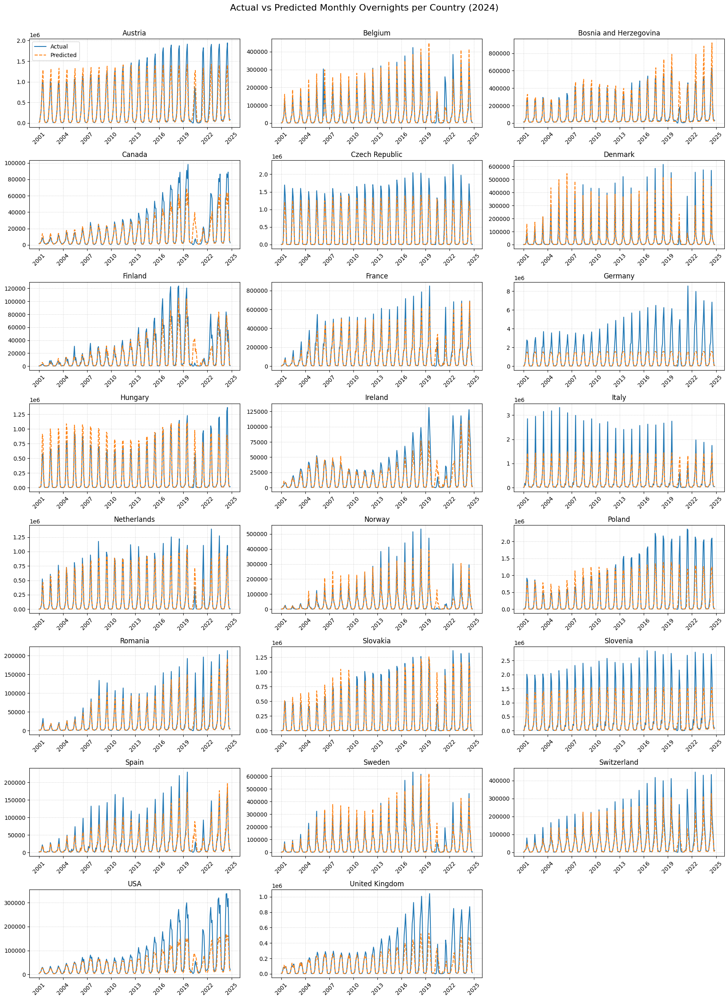

In [240]:
# Country-level plots
countries = df_plot['country'].unique()
fig, axes = plt.subplots(len(countries) // 3 + 1, 3, figsize=(18, 3 * (len(countries) // 3 + 1)), sharex=False, sharey=False)

axes = axes.flatten()

for i, country in enumerate(countries):
    country_df = df_plot[df_plot['country'] == country].groupby('date')[['actual', 'predicted']].sum()
    ax = axes[i]
    ax.plot(country_df.index, country_df['actual'], label='Actual')
    ax.plot(country_df.index, country_df['predicted'], label='Predicted', linestyle='--')
    ax.set_title(country)
    
    # Show x-axis ticks every 3 years
    ax.xaxis.set_major_locator(mdates.YearLocator(base=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)

    # Add legend only once
    if i == 0:
        ax.legend()

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
fig.suptitle('Actual vs Predicted Monthly Overnights per Country (2024)', fontsize=16, y=1.02)
plt.show()

In [241]:
# df_plot: DataFrame with columns ['country', 'date', 'actual', 'predicted']
# List of countries
countries = df_plot['country'].unique()

results = []

for country in countries:
    # Subset data for this country (test set only, if you want)
    country_df = df_plot[(df_plot['country'] == country) & (df_plot['date'] > val_end)]
    
    actual = country_df['actual'].values
    pred = country_df['predicted'].values
    
    if len(actual) == 0:
        continue  # Skip countries with no data in test set
    
    mse = round(mean_squared_error(actual, pred),6)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, pred)
    mape = mean_absolute_percentage_error(actual, pred)
    r2 = r2_score(actual, pred)
    
    results.append({
        'country': country,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape,
        'R2': r2
    })

# Convert to DataFrame for easy export or display
country_metrics = pd.DataFrame(results)
print(country_metrics)

                   country           MSE          RMSE           MAE  \
0                  Austria  1.028618e+11  3.207207e+05  2.174073e+05   
1                  Belgium  2.086010e+09  4.567286e+04  2.272012e+04   
2   Bosnia and Herzegovina  8.145445e+09  9.025212e+04  4.634687e+04   
3                   Canada  1.774758e+08  1.332201e+04  8.498550e+03   
4           Czech Republic  6.500328e+10  2.549574e+05  1.214085e+05   
5                  Denmark  3.653635e+09  6.044530e+04  2.052040e+04   
6                  Finland  2.066050e+08  1.437376e+04  8.788207e+03   
7                   France  3.886561e+09  6.234229e+04  3.070490e+04   
8                  Germany  4.779323e+12  2.186166e+06  1.200339e+06   
9                  Hungary  1.688156e+10  1.299290e+05  6.355589e+04   
10                 Ireland  4.933720e+08  2.221198e+04  1.300958e+04   
11                   Italy  2.409223e+10  1.552167e+05  7.373700e+04   
12             Netherlands  2.083571e+10  1.443458e+05  6.193622

# Overnights 2019 LR=0.001 Model 4

In [324]:
# Load and clean data
cool = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/df_top_cool.csv")
cool.replace('..', np.nan, inplace=True)
cool['date'] = pd.to_datetime(cool[['year', 'month']].assign(day=1))
lag_cols = [col for col in cool.columns if 'lag' in col]
cool = cool.drop(columns=lag_cols, errors='ignore')
cool = cool[~cool['country'].isin(['Russian Federation'])]

In [325]:
# Convert types
cool['year'] = pd.to_numeric(cool['year'], downcast='integer', errors='coerce')
cool['month'] = pd.to_numeric(cool['month'], downcast='integer', errors='coerce')
cool['arrivals'] = pd.to_numeric(cool['arrivals'], errors='coerce')
cool['overnights'] = pd.to_numeric(cool['overnights'], errors='coerce')
cool['unemployment_rate'] = pd.to_numeric(cool['unemployment_rate'], errors='coerce')
cool['exchange_rate'] = pd.to_numeric(cool['exchange_rate'], errors='coerce')
cool['cpi'] = pd.to_numeric(cool['cpi'], errors='coerce')
cool['eu_member'] = cool['eu_member'].astype(int)
cool['euro_adopted'] = cool['euro_adopted'].astype(int)

# Merge Google Trends data
td = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/multiTimeline.csv")
cool['date'] = pd.to_datetime(cool['date']).dt.to_period('M').dt.to_timestamp()
td['date'] = pd.to_datetime(td['date']).dt.to_period('M').dt.to_timestamp()
td_long = td.melt(id_vars='date', var_name='country', value_name='google_trends')
cool = cool.merge(td_long, on=['date', 'country'], how='left')
cool['google_trends'] = cool['google_trends'].fillna(-1)

# Sort and log-transform
cool = cool.sort_values(['country', 'date']).reset_index(drop=True)
cool = cool.drop_duplicates(subset=['country', 'date'], keep='first').reset_index(drop=True)
cool['arrivals'] = np.log1p(cool['arrivals']) 
cool['overnights'] = np.log1p(cool['overnights'])
cool['exchange_rate'] = np.log1p(cool['exchange_rate'])
cool['cpi'] = np.log1p(cool['cpi'])
cool['overnights_next_month'] = cool.groupby('country')['overnights'].shift(-1)

# One-hot encode month
month_names = {i: month for i, month in enumerate(['January','February','March','April','May','June','July','August','September','October','November','December'], 1)}
cool['month_name'] = cool['month'].map(month_names)
ohe_month = pd.get_dummies(cool['month_name'], prefix='month').astype(int)
cool = pd.concat([cool, ohe_month], axis=1).drop(columns=['month_name'])

# Create lags
lags = {'arrivals': [1, 3, 6, 12], 'overnights': [1, 3, 6, 12], 'cpi': [1], 'unemployment_rate': [3], 'google_trends': [1, 3]}
for var, steps in lags.items():
    for lag in steps:
        cool[f'{var}_lag_{lag}'] = cool.groupby('country')[var].shift(lag)

cool
# Step 1: Define Schengen entry years
schengen_entry_year = {
    'Austria': 1995,
    'Belgium': 1995,
    'Czech Republic': 2007,
    'Denmark': 2001,
    'Finland': 1996,
    'France': 1995,
    'Germany': 1995,
    'Hungary': 2007,
    'Italy': 1997,
    'Netherlands': 1995,
    'Norway': 2001,
    'Poland': 2007,
    'Portugal': 1995,
    'Slovakia': 2007,
    'Slovenia': 2007,
    'Spain': 1995,
    'Sweden': 2001,
    'Switzerland': 2008,
    'Romania': 2024,}

def is_schengen_member(row):
    entry_year = schengen_entry_year.get(row['country'], np.inf)
    return int(row['year'] >= entry_year)

cool['schengen_member'] = cool.apply(is_schengen_member, axis=1).astype('int8')

# Filter and drop missing
cool.isna().sum().sort_values(ascending=False) 
cool = cool[cool['date'] >= '2001-01-01']
cool = cool[cool['date'] <= '2019-12-01']
cool = cool[cool['overnights_next_month'].notna()].copy()

In [326]:
# Label encode country and scale numeric features
cool['country_encoded'] = LabelEncoder().fit_transform(cool['country'])
month_cols = [col for col in cool.columns if col.startswith('month_')]
X_numeric = cool[[
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'overnights_lag_1', 'overnights_lag_3', 'overnights_lag_6', 'overnights_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member','euro_adopted'] + month_cols].values
X_country_array = cool['country_encoded'].astype('int32').values
y = cool['overnights_next_month'].values

In [327]:
# Time-based split
train_end = pd.Timestamp("2014-12-31")
val_end = pd.Timestamp("2017-12-31")
train_mask = cool['date'] <= train_end
val_mask = (cool['date'] > train_end) & (cool['date'] <= val_end)
test_mask = cool['date'] > val_end

scaler = StandardScaler()
X_num_train = scaler.fit_transform(X_numeric[train_mask])
X_num_val = scaler.transform(X_numeric[val_mask])
X_num_test = scaler.transform(X_numeric[test_mask])
X_numeric_scaled_all = scaler.transform(X_numeric)

X_cat_train = X_country_array[train_mask.to_numpy()]
X_cat_val = X_country_array[val_mask.to_numpy()]
X_cat_test = X_country_array[test_mask.to_numpy()]
y_train = y[train_mask.to_numpy()]
y_val = y[val_mask.to_numpy()]
y_test = y[test_mask.to_numpy()]


In [328]:
# Define model4
input_numeric = Input(shape=(X_num_train.shape[1],), name="numeric_input")
input_country = Input(shape=(1,), dtype='int32', name="country_input")
n_countries = cool['country_encoded'].nunique()
embedding = Embedding(input_dim=n_countries, output_dim=10)(input_country)
embedding_flat = Flatten()(embedding)
x = Concatenate()([input_numeric, embedding_flat])
x = Dense(64, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
x = Dense(32, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
output = Dense(1)(x)
model4 = Model(inputs=[input_numeric, input_country], outputs=output)
model4.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
model4.summary()

# Train mode4
early_stop = EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=True)
history = model4.fit(
    [X_num_train, X_cat_train], y_train,
    validation_data=([X_num_val, X_cat_val], y_val),
    epochs=100, batch_size=16, callbacks=[early_stop]
)

Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ country_input       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_36        │ (None, 1, 10)     │        230 │ country_input[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ numeric_input       │ (None, 25)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_36          │ (None, 10)        │          0 │ embedding_36[0][… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_36      │ (None, 35)        │          0 │ numeric_input[0]… │
│ (Concatenate)       │                   │            │ flatten_36[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_108 (Dense)   │ (None, 64)        │      2,304 │ concatenate_36[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_108[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_72          │ (None, 64)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_109 (Dense)   │ (None, 32)        │      2,080 │ dropout_72[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_109[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_73          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_110 (Dense)   │ (None, 1)         │         33 │ dropout_73[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,031 (19.65 KB)

 Trainable params: 4,839 (18.90 KB)

 Non-trainable params: 192 (768.00 B)

Epoch 1/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 12s 8ms/step - loss: 90.7974 - val_loss: 46.7961
Epoch 2/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 33.5081 - val_loss: 3.1799
Epoch 3/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 5.2712 - val_loss: 0.7961
Epoch 4/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 3.8846 - val_loss: 0.5789
Epoch 5/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 3.2203 - val_loss: 0.5077
Epoch 6/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.9854 - val_loss: 0.5004
Epoch 7/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 2.8682 - val_loss: 0.4250
Epoch 8/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.5530 - val_loss: 0.4092
Epoch 9/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.3035 - val_loss: 0.4177
Epoch 10/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.0789 - val_loss: 0.3989
Epoch 11/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 1.9518 - val_loss: 0.3952
Epoch 12/100
242/242 ━━━━━━━━━━━━━━━━

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━━━━━━━━━━━

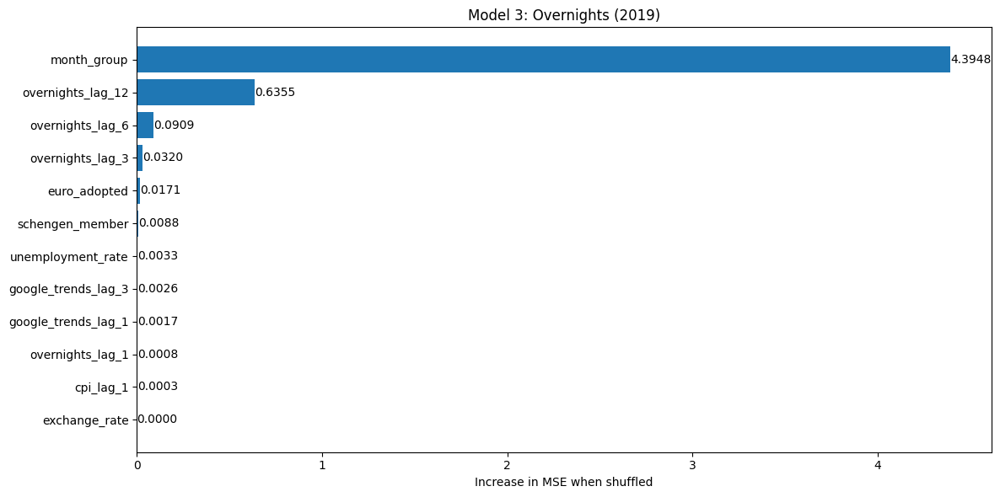

In [329]:
# Baseline predictions
baseline_preds = model4.predict([X_num_test, X_cat_test]).flatten()
baseline_mse = mean_squared_error(y_test, baseline_preds)

feature_names = [
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'overnights_lag_1', 'overnights_lag_3', 'overnights_lag_6', 'overnights_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted']+month_cols

importances = []
for i in range(X_num_test.shape[1]):
    X_permuted = X_num_test.copy()
    X_permuted[:, i] = np.random.permutation(X_permuted[:, i])
    permuted_preds = model4.predict([X_permuted, X_cat_test]).flatten()
    permuted_mse = mean_squared_error(y_test, permuted_preds)
    importances.append(max(0, permuted_mse - baseline_mse))

#Handle grouped month dummies so its not one bar for each month
month_indices = [i for i, f in enumerate(feature_names) if f.startswith('month_')]

if month_indices:
    # Safe grouped permutation
    X_month_permuted = X_num_test.copy()
    row_perm = np.random.permutation(len(X_month_permuted))
    X_month_permuted[:, month_indices] = X_month_permuted[row_perm][:, month_indices]
    month_preds = model4.predict([X_month_permuted, X_cat_test]).flatten()
    month_importance = max(0, mean_squared_error(y_test, month_preds) - baseline_mse)
else:
    month_importance = 0  # fallback if no month cols present

filtered_names = [f for i, f in enumerate(feature_names) if i not in month_indices]
filtered_importances = [imp for i, imp in enumerate(importances) if i not in month_indices]
feature_names_final = filtered_names + ['month_group']
importances_final = filtered_importances + [month_importance]
sorted_pairs = sorted(zip(importances_final, feature_names_final), reverse=True)
importances_sorted, feature_names_sorted = zip(*sorted_pairs)

plt.figure(figsize=(12, 6))
bars = plt.barh(feature_names_sorted, importances_sorted)
plt.xlabel("Increase in MSE when shuffled")
plt.title("Model 3: Overnights (2019)")
plt.gca().invert_yaxis()

# Add labels
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.001, bar.get_y() + bar.get_height() / 2,
             f"{width:.4f}", va='center')

plt.tight_layout()
plt.show()

## Model Evaluation

121/121 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Train MSE: 0.1149, RMSE: 0.3390, MAE: 0.2549, MAPE: 0.0277, R²: 0.9768
Test MSE: 0.3801, RMSE: 0.6165, MAE: 0.4971, MAPE: 0.0493, R²: 0.9077


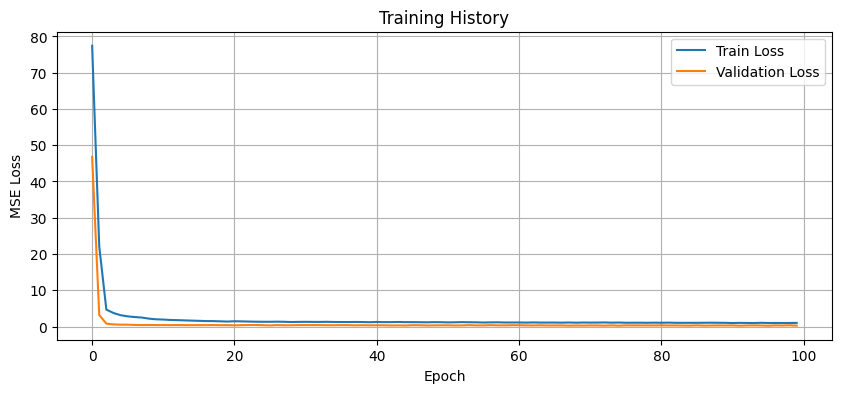

In [330]:
## Model evalauation
# Predict and flatten
train_preds = model4.predict([X_num_train, X_cat_train]).flatten()
test_preds = model4.predict([X_num_test, X_cat_test]).flatten()

# MSE
train_mse = mean_squared_error(y_train, train_preds)
test_mse = mean_squared_error(y_test, test_preds)

# RMSE
train_rmse4 = np.sqrt(train_mse)
test_rmse4 = np.sqrt(test_mse)

#MAE
train_mae4 = mean_absolute_error(y_train, train_preds)
test_mae4 = mean_absolute_error(y_test, test_preds)

# MAPE
train_mape4 = mean_absolute_percentage_error(y_train, train_preds)
test_mape4 = mean_absolute_percentage_error(y_test, test_preds)

# R-squared
train_r2_4 = r2_score(y_train, train_preds)
test_r2_4 = r2_score(y_test, test_preds)

# Print all metrics
print(f"Train MSE: {train_mse:.4f}, RMSE: {train_rmse4:.4f}, MAE: {train_mae4:.4f}, MAPE: {train_mape4:.4f}, R²: {train_r2_4:.4f}")
print(f"Test MSE: {test_mse:.4f}, RMSE: {test_rmse4:.4f}, MAE: {test_mae4:.4f}, MAPE: {test_mape4:.4f}, R²: {test_r2_4:.4f}")

# Plot training history
plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True)
plt.show()

164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


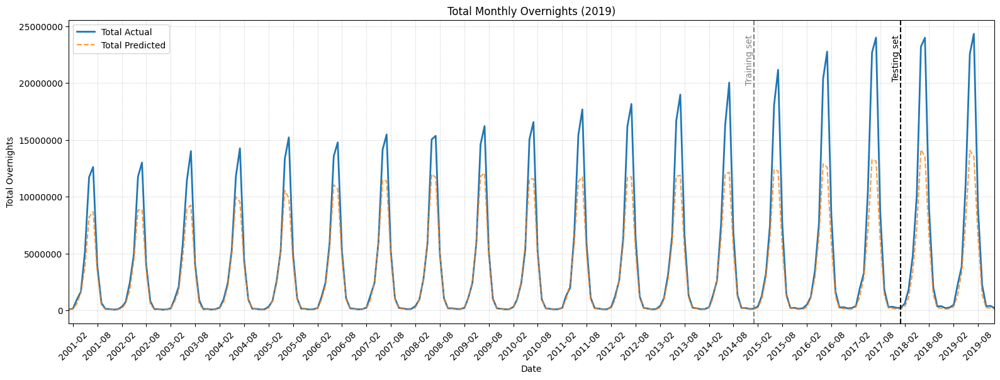

In [331]:
# Global trend plot (total actual vs predicted per month)
y_pred_all = model4.predict([X_numeric_scaled_all, X_country_array]).flatten()
y_actual_all = np.expm1(y)
y_pred_all = np.expm1(y_pred_all)
df_plot = cool.copy()
df_plot['actual'] = y_actual_all
df_plot['predicted'] = y_pred_all
monthly_totals_all = df_plot.groupby('date')[['actual', 'predicted']].sum()

plt.figure(figsize=(16, 6))
plt.plot(monthly_totals_all.index, monthly_totals_all['actual'], label='Total Actual', linewidth=2)
plt.plot(monthly_totals_all.index, monthly_totals_all['predicted'], label='Total Predicted', linestyle='--', alpha=0.8)
plt.title("Total Monthly Overnights (2019)")
plt.xlabel("Date")
plt.ylabel("Total Overnights")
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='y')
plt.legend()
plt.tight_layout()
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.xlim(monthly_totals_all.index.min(), monthly_totals_all.index.max())
plt.axvline(x=train_end, color='gray', linestyle='--', linewidth=1.5, label='Train/Val Split')
plt.axvline(x=val_end, color='black', linestyle='--', linewidth=1.5, label='Val/Test Split')
plt.text(train_end, plt.ylim()[1]*0.95, 'Training set', rotation=90, ha='right', va='top', color='gray')
plt.text(val_end, plt.ylim()[1]*0.95, 'Testing set', rotation=90, ha='right', va='top', color='black')
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)
plt.show()

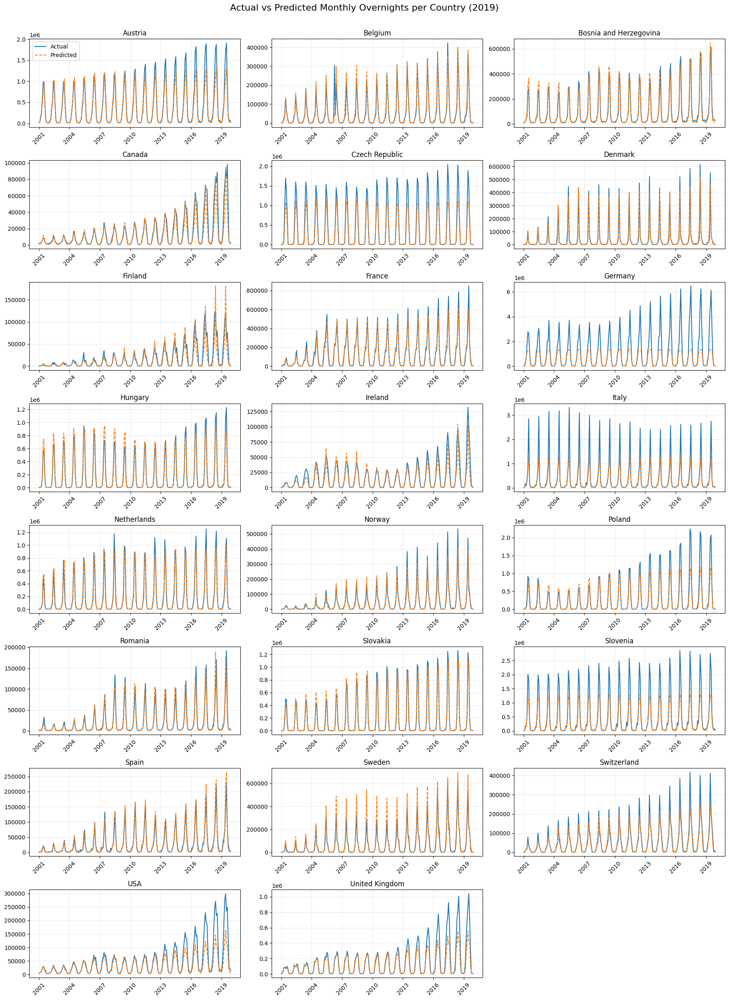

In [332]:
# Country-level plots
countries = df_plot['country'].unique()
fig, axes = plt.subplots(len(countries) // 3 + 1, 3, figsize=(18, 3 * (len(countries) // 3 + 1)), sharex=False, sharey=False)

axes = axes.flatten()

for i, country in enumerate(countries):
    country_df = df_plot[df_plot['country'] == country].groupby('date')[['actual', 'predicted']].sum()
    ax = axes[i]
    ax.plot(country_df.index, country_df['actual'], label='Actual')
    ax.plot(country_df.index, country_df['predicted'], label='Predicted', linestyle='--')
    ax.set_title(country)
    
    # Show x-axis ticks every 3 years
    ax.xaxis.set_major_locator(mdates.YearLocator(base=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)

    # Add legend only once
    if i == 0:
        ax.legend()

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
fig.suptitle('Actual vs Predicted Monthly Overnights per Country (2019)', fontsize=16, y=1.02)
plt.show()

In [333]:
# df_plot: DataFrame with columns ['country', 'date', 'actual', 'predicted']
# List of countries
countries = df_plot['country'].unique()

results = []

for country in countries:
    # Subset data for this country (test set only, if you want)
    country_df = df_plot[(df_plot['country'] == country) & (df_plot['date'] > val_end)]
    
    actual = country_df['actual'].values
    pred = country_df['predicted'].values
    
    if len(actual) == 0:
        continue  # Skip countries with no data in test set
    
    mse = round(mean_squared_error(actual, pred),6)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, pred)
    mape = mean_absolute_percentage_error(actual, pred)
    r2 = r2_score(actual, pred)
    
    results.append({
        'country': country,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape,
        'R2': r2
    })

# Convert to DataFrame for easy export or display
country_metrics = pd.DataFrame(results)
print(country_metrics)

                   country           MSE          RMSE           MAE  \
0                  Austria  9.030588e+10  3.005094e+05  1.864868e+05   
1                  Belgium  2.222734e+08  1.490884e+04  9.771725e+03   
2   Bosnia and Herzegovina  1.791651e+09  4.232790e+04  3.016650e+04   
3                   Canada  4.502302e+08  2.121863e+04  1.406842e+04   
4           Czech Republic  9.575052e+10  3.094358e+05  1.572649e+05   
5                  Denmark  1.668924e+09  4.085246e+04  2.036179e+04   
6                  Finland  8.806166e+08  2.967519e+04  2.118418e+04   
7                   France  5.216737e+09  7.222698e+04  3.979571e+04   
8                  Germany  3.592724e+12  1.895448e+06  1.056744e+06   
9                  Hungary  1.180876e+10  1.086681e+05  5.517401e+04   
10                 Ireland  5.457368e+08  2.336101e+04  1.457357e+04   
11                   Italy  1.764677e+11  4.200806e+05  1.610925e+05   
12             Netherlands  4.946827e+09  7.033368e+04  3.836726

# Arrivals 2024 LR = 0.001 Model 2

In [ ]:
# Load and clean data
cool = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/df_top_cool.csv")
cool.replace('..', np.nan, inplace=True)
cool['date'] = pd.to_datetime(cool[['year', 'month']].assign(day=1))
lag_cols = [col for col in cool.columns if 'lag' in col]
cool = cool.drop(columns=lag_cols, errors='ignore')
cool = cool[~cool['country'].isin(['Russian Federation'])]

In [ ]:
# Convert types
cool['year'] = pd.to_numeric(cool['year'], downcast='integer', errors='coerce')
cool['month'] = pd.to_numeric(cool['month'], downcast='integer', errors='coerce')
cool['arrivals'] = pd.to_numeric(cool['arrivals'], errors='coerce')
cool['overnights'] = pd.to_numeric(cool['overnights'], errors='coerce')
cool['unemployment_rate'] = pd.to_numeric(cool['unemployment_rate'], errors='coerce')
cool['exchange_rate'] = pd.to_numeric(cool['exchange_rate'], errors='coerce')
cool['cpi'] = pd.to_numeric(cool['cpi'], errors='coerce')
cool['eu_member'] = cool['eu_member'].astype(int)
cool['euro_adopted'] = cool['euro_adopted'].astype(int)

# Merge Google Trends data
td = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/multiTimeline.csv")
cool['date'] = pd.to_datetime(cool['date']).dt.to_period('M').dt.to_timestamp()
td['date'] = pd.to_datetime(td['date']).dt.to_period('M').dt.to_timestamp()
td_long = td.melt(id_vars='date', var_name='country', value_name='google_trends')
cool = cool.merge(td_long, on=['date', 'country'], how='left')
cool['google_trends'] = cool['google_trends'].fillna(-1)

# Sort and log-transform
cool = cool.sort_values(['country', 'date']).reset_index(drop=True)
cool = cool.drop_duplicates(subset=['country', 'date'], keep='first').reset_index(drop=True)
cool['arrivals'] = np.log1p(cool['arrivals']) 
cool['overnights'] = np.log1p(cool['overnights'])
cool['exchange_rate'] = np.log1p(cool['exchange_rate'])
cool['cpi'] = np.log1p(cool['cpi'])
cool['arrivals_next_month'] = cool.groupby('country')['arrivals'].shift(-1)

# One-hot encode month
month_names = {i: month for i, month in enumerate(['January','February','March','April','May','June','July','August','September','October','November','December'], 1)}
cool['month_name'] = cool['month'].map(month_names)
ohe_month = pd.get_dummies(cool['month_name'], prefix='month').astype(int)
cool = pd.concat([cool, ohe_month], axis=1).drop(columns=['month_name'])

# Create lags
lags = {'arrivals': [1, 3, 6, 12], 'overnights': [1, 3, 6, 12], 'cpi': [1], 'unemployment_rate': [3], 'google_trends': [1, 3]}
for var, steps in lags.items():
    for lag in steps:
        cool[f'{var}_lag_{lag}'] = cool.groupby('country')[var].shift(lag)

# Step 1: Define Schengen entry years
schengen_entry_year = {
    'Austria': 1995,
    'Belgium': 1995,
    'Czech Republic': 2007,
    'Denmark': 2001,
    'Finland': 1996,
    'France': 1995,
    'Germany': 1995,
    'Hungary': 2007,
    'Italy': 1997,
    'Netherlands': 1995,
    'Norway': 2001,
    'Poland': 2007,
    'Portugal': 1995,
    'Slovakia': 2007,
    'Slovenia': 2007,
    'Spain': 1995,
    'Sweden': 2001,
    'Switzerland': 2008,
    'Romania': 2024,}

def is_schengen_member(row):
    entry_year = schengen_entry_year.get(row['country'], np.inf)
    return int(row['year'] >= entry_year)

cool['schengen_member'] = cool.apply(is_schengen_member, axis=1).astype('int8')

# Filter and drop missing
cool.isna().sum().sort_values(ascending=False) 
cool = cool[cool['date'] >= '2001-01-01']
cool = cool[cool['arrivals_next_month'].notna()].copy()

In [ ]:
# Label encode country and scale numeric features
cool['country_encoded'] = LabelEncoder().fit_transform(cool['country'])
month_cols = [col for col in cool.columns if col.startswith('month_')]
X_numeric = cool[[
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'arrivals_lag_1', 'arrivals_lag_3', 'arrivals_lag_6', 'arrivals_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member','euro_adopted'] + month_cols].values
X_country_array = cool['country_encoded'].astype('int32').values
y = cool['arrivals_next_month'].values

In [ ]:
cool

,country,arrivals,overnights,date,year,month,month_sin,month_cos,eu_member,euro_adopted,...,overnights_lag_1,overnights_lag_3,overnights_lag_6,overnights_lag_12,cpi_lag_1,unemployment_rate_lag_3,google_trends_lag_1,google_trends_lag_3,schengen_member,country_encoded
12,Austria,7.873217,9.102867,2001-01-01,2001,1,0.500000,8.660254e-01,1,1,...,9.624303,11.286840,13.687496,9.077951,4.439116,3.6,-1.0,-1.0,1,0
13,Austria,8.664923,9.856815,2001-02-01,2001,2,0.866025,5.000000e-01,1,1,...,9.102867,9.441055,13.771151,9.606159,4.440296,3.5,-1.0,-1.0,1,0
14,Austria,9.258368,10.391976,2001-03-01,2001,3,1.000000,6.120000e-17,1,1,...,9.856815,9.624303,13.051318,10.189080,4.443827,3.8,-1.0,-1.0,1,0
15,Austria,10.645711,11.952940,2001-04-01,2001,4,0.866025,-5.000000e-01,1,1,...,10.391976,9.102867,11.286840,11.828816,4.445001,4.2,-1.0,-1.0,1,0
16,Austria,11.169632,12.518896,2001-05-01,2001,5,0.500000,-8.660254e-01,1,1,...,11.952940,9.856815,9.441055,12.243176,4.450853,4.5,-1.0,-1.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6892,United Kingdom,11.936578,13.523750,2024-07-01,2024,7,-0.500000,-8.660254e-01,0,0,...,13.349341,11.997115,8.512783,13.465556,5.016617,4.3,47.0,35.0,0,22
6893,United Kingdom,12.015293,13.678767,2024-08-01,2024,8,-0.866025,-5.000000e-01,0,0,...,13.523750,12.908799,9.019059,13.632791,5.014627,4.1,47.0,32.0,0,22
6894,United Kingdom,11.742989,13.317415,2024-09-01,2024,9,-1.000000,-1.840000e-16,0,0,...,13.678767,13.349341,9.886138,13.254668,5.018603,4.2,41.0,47.0,0,22
6895,United Kingdom,10.992100,12.530613,2024-10-01,2024,10,-0.866025,5.000000e-01,0,0,...,13.317415,13.523750,11.997115,12.325113,5.017942,4.2,30.0,47.0,0,22


In [ ]:
cool.isna().sum()

country                      0
arrivals                     0
overnights                   0
date                         0
year                         0
month                        0
month_sin                    0
month_cos                    0
eu_member                    0
euro_adopted                 0
unemployment_rate            0
exchange_rate                0
industry_production        363
cpi                          0
google_trends                0
arrivals_next_month          0
month_April                  0
month_August                 0
month_December               0
month_February               0
month_January                0
month_July                   0
month_June                   0
month_March                  0
month_May                    0
month_November               0
month_October                0
month_September              0
arrivals_lag_1               0
arrivals_lag_3               0
arrivals_lag_6               0
arrivals_lag_12              0
overnigh

In [ ]:
# Time-based split
train_end = pd.Timestamp("2016-12-31")
val_end = pd.Timestamp("2020-12-31")
train_mask = cool['date'] <= train_end
val_mask = (cool['date'] > train_end) & (cool['date'] <= val_end)
test_mask = cool['date'] > val_end

scaler = StandardScaler()
X_num_train = scaler.fit_transform(X_numeric[train_mask])
X_num_val = scaler.transform(X_numeric[val_mask])
X_num_test = scaler.transform(X_numeric[test_mask])
X_numeric_scaled_all = scaler.transform(X_numeric)  

X_cat_train = X_country_array[train_mask.to_numpy()]
X_cat_val = X_country_array[val_mask.to_numpy()]
X_cat_test = X_country_array[test_mask.to_numpy()]
y_train = y[train_mask.to_numpy()]
y_val = y[val_mask.to_numpy()]
y_test = y[test_mask.to_numpy()]

# Define model2
input_numeric = Input(shape=(X_num_train.shape[1],), name="numeric_input")
input_country = Input(shape=(1,), dtype='int32', name="country_input")
n_countries = cool['country_encoded'].nunique()
embedding = Embedding(input_dim=n_countries, output_dim=10)(input_country)
embedding_flat = Flatten()(embedding)
x = Concatenate()([input_numeric, embedding_flat])
x = Dense(64, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
x = Dense(32, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
output = Dense(1)(x)
model2 = Model(inputs=[input_numeric, input_country], outputs=output)
model2.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
model2.summary()

# Train model2
early_stop = EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=True)
history = model2.fit(
    [X_num_train, X_cat_train], y_train,
    validation_data=([X_num_val, X_cat_val], y_val),
    epochs=100, batch_size=16, callbacks=[early_stop]
)

Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ country_input       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_37        │ (None, 1, 10)     │        230 │ country_input[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ numeric_input       │ (None, 25)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_37          │ (None, 10)        │          0 │ embedding_37[0][… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_37      │ (None, 35)        │          0 │ numeric_input[0]… │
│ (Concatenate)       │                   │            │ flatten_37[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_111 (Dense)   │ (None, 64)        │      2,304 │ concatenate_37[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_111[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_74          │ (None, 64)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_112 (Dense)   │ (None, 32)        │      2,080 │ dropout_74[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_112[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_75          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_113 (Dense)   │ (None, 1)         │         33 │ dropout_75[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,031 (19.65 KB)

 Trainable params: 4,839 (18.90 KB)

 Non-trainable params: 192 (768.00 B)

Epoch 1/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - loss: 67.6397 - val_loss: 24.2574
Epoch 2/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 16.7866 - val_loss: 2.7601
Epoch 3/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 3.6225 - val_loss: 2.3808
Epoch 4/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 2.9429 - val_loss: 2.4379
Epoch 5/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 2.4179 - val_loss: 2.2861
Epoch 6/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 2.2089 - val_loss: 2.4861
Epoch 7/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.8824 - val_loss: 2.4279
Epoch 8/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.7382 - val_loss: 2.4234
Epoch 9/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 1.6110 - val_loss: 2.4041
Epoch 10/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 1.3417 - val_loss: 2.2658
Epoch 11/100
276/276 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 1.2643 - val_loss: 2.2970
Epoch 12/100
276/276 ━━━━━━━━━━━

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━

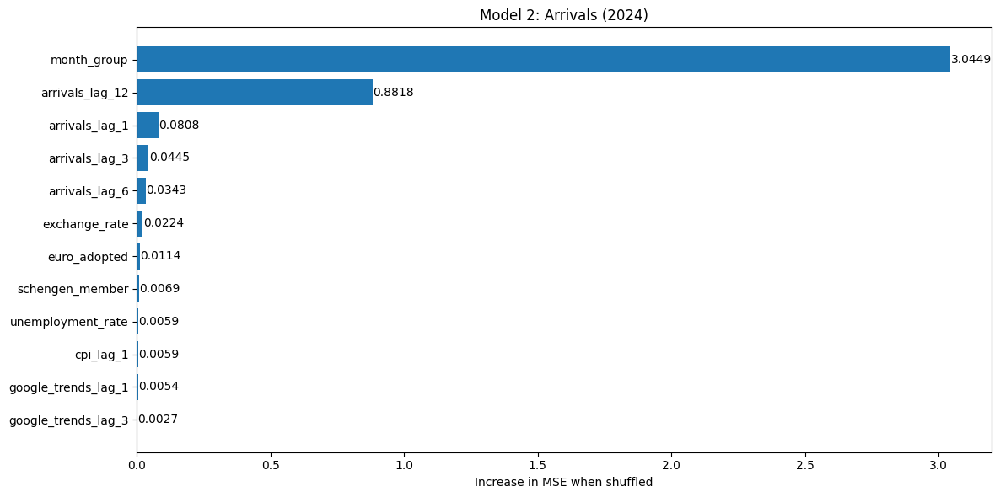

In [ ]:
# Baseline predictions
baseline_preds = model2.predict([X_num_test, X_cat_test]).flatten()
baseline_mse = mean_squared_error(y_test, baseline_preds)

feature_names = [
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'arrivals_lag_1', 'arrivals_lag_3', 'arrivals_lag_6', 'arrivals_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted']+month_cols

importances = []
for i in range(X_num_test.shape[1]):
    X_permuted = X_num_test.copy()
    X_permuted[:, i] = np.random.permutation(X_permuted[:, i])
    permuted_preds = model2.predict([X_permuted, X_cat_test]).flatten()
    permuted_mse = mean_squared_error(y_test, permuted_preds)
    importances.append(permuted_mse - baseline_mse)

#Handle grouped month dummies so its not one bar for each month
month_indices = [i for i, f in enumerate(feature_names) if f.startswith('month_')]

if month_indices:
    # Safe grouped permutation
    X_month_permuted = X_num_test.copy()
    row_perm = np.random.permutation(len(X_month_permuted))
    X_month_permuted[:, month_indices] = X_month_permuted[row_perm][:, month_indices]
    month_preds = model2.predict([X_month_permuted, X_cat_test]).flatten()
    month_importance = mean_squared_error(y_test, month_preds) - baseline_mse
else:
    month_importance = 0  # fallback if no month cols present

filtered_names = [f for i, f in enumerate(feature_names) if i not in month_indices]
filtered_importances = [imp for i, imp in enumerate(importances) if i not in month_indices]
feature_names_final = filtered_names + ['month_group']
importances_final = filtered_importances + [month_importance]
sorted_pairs = sorted(zip(importances_final, feature_names_final), reverse=True)
importances_sorted, feature_names_sorted = zip(*sorted_pairs)

plt.figure(figsize=(12, 6))
bars = plt.barh(feature_names_sorted, importances_sorted)
plt.xlabel("Increase in MSE when shuffled")
plt.title("Model 2: Arrivals (2024)")
plt.gca().invert_yaxis()

# Add labels
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.001, bar.get_y() + bar.get_height() / 2,
             f"{width:.4f}", va='center')

plt.tight_layout()
plt.show()

## Model Evaluation

138/138 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train MSE: 0.0749, RMSE: 0.2738, MAE: 0.2059, MAPE: 0.0257, R²: 0.9807
Test MSE: 0.4215, RMSE: 0.6492, MAE: 0.4911, MAPE: 0.0579, R²: 0.8919


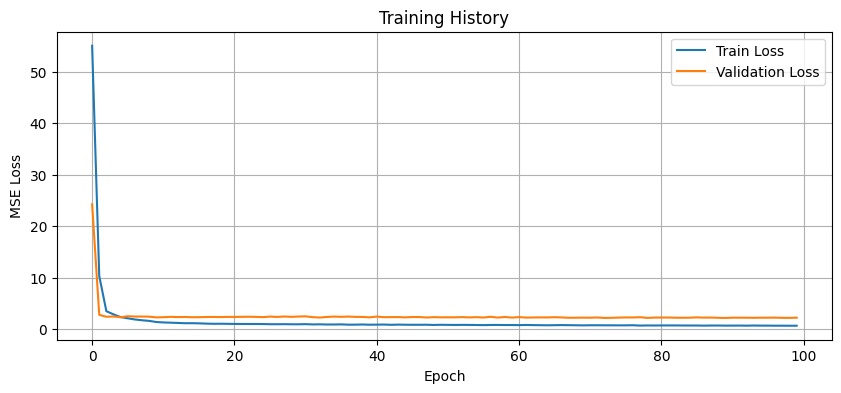

In [ ]:
## Model evalauation
# Predict and flatten
train_preds = model2.predict([X_num_train, X_cat_train]).flatten()
test_preds = model2.predict([X_num_test, X_cat_test]).flatten()

# MSE
train_mse = mean_squared_error(y_train, train_preds)
test_mse = mean_squared_error(y_test, test_preds)

# RMSE
train_rmse2 = np.sqrt(train_mse)
test_rmse2 = np.sqrt(test_mse)

#MAE
train_mae2 = mean_absolute_error(y_train, train_preds)
test_mae2 = mean_absolute_error(y_test, test_preds)

# MAPE
train_mape2 = mean_absolute_percentage_error(y_train, train_preds)
test_mape2 = mean_absolute_percentage_error(y_test, test_preds)

# R-squared
train_r2_2 = r2_score(y_train, train_preds)
test_r2_2 = r2_score(y_test, test_preds)

# Print all metrics
print(f"Train MSE: {train_mse:.4f}, RMSE: {train_rmse2:.4f}, MAE: {train_mae2:.4f}, MAPE: {train_mape2:.4f}, R²: {train_r2_2:.4f}")
print(f"Test MSE: {test_mse:.4f}, RMSE: {test_rmse2:.4f}, MAE: {test_mae2:.4f}, MAPE: {test_mape2:.4f}, R²: {test_r2_2:.4f}")

# Plot training history
plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True)
plt.show()

207/207 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


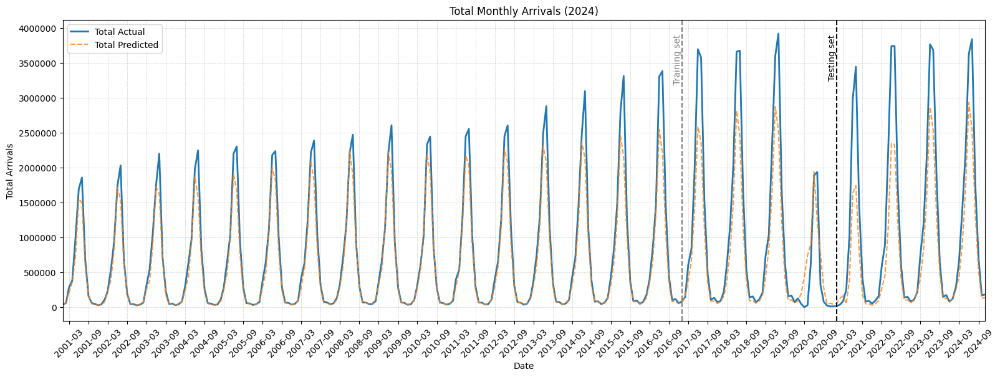

In [ ]:
# Global trend plot (total actual vs predicted per month)
y_pred_all = model2.predict([X_numeric_scaled_all, X_country_array]).flatten()
y_actual_all = np.expm1(y)
y_pred_all = np.expm1(y_pred_all)
df_plot = cool.copy()
df_plot['actual'] = y_actual_all
df_plot['predicted'] = y_pred_all
monthly_totals_all = df_plot.groupby('date')[['actual', 'predicted']].sum()

plt.figure(figsize=(16, 6))
plt.plot(monthly_totals_all.index, monthly_totals_all['actual'], label='Total Actual', linewidth=2)
plt.plot(monthly_totals_all.index, monthly_totals_all['predicted'], label='Total Predicted', linestyle='--', alpha=0.8)
plt.title("Total Monthly Arrivals (2024)")
plt.xlabel("Date")
plt.ylabel("Total Arrivals")
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='y')
plt.legend()
plt.tight_layout()
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.xlim(monthly_totals_all.index.min(), monthly_totals_all.index.max())
plt.axvline(x=train_end, color='gray', linestyle='--', linewidth=1.5, label='Train/Val Split')
plt.axvline(x=val_end, color='black', linestyle='--', linewidth=1.5, label='Val/Test Split')
plt.text(train_end, plt.ylim()[1]*0.95, 'Training set', rotation=90, ha='right', va='top', color='gray')
plt.text(val_end, plt.ylim()[1]*0.95, 'Testing set', rotation=90, ha='right', va='top', color='black')
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)
plt.show()

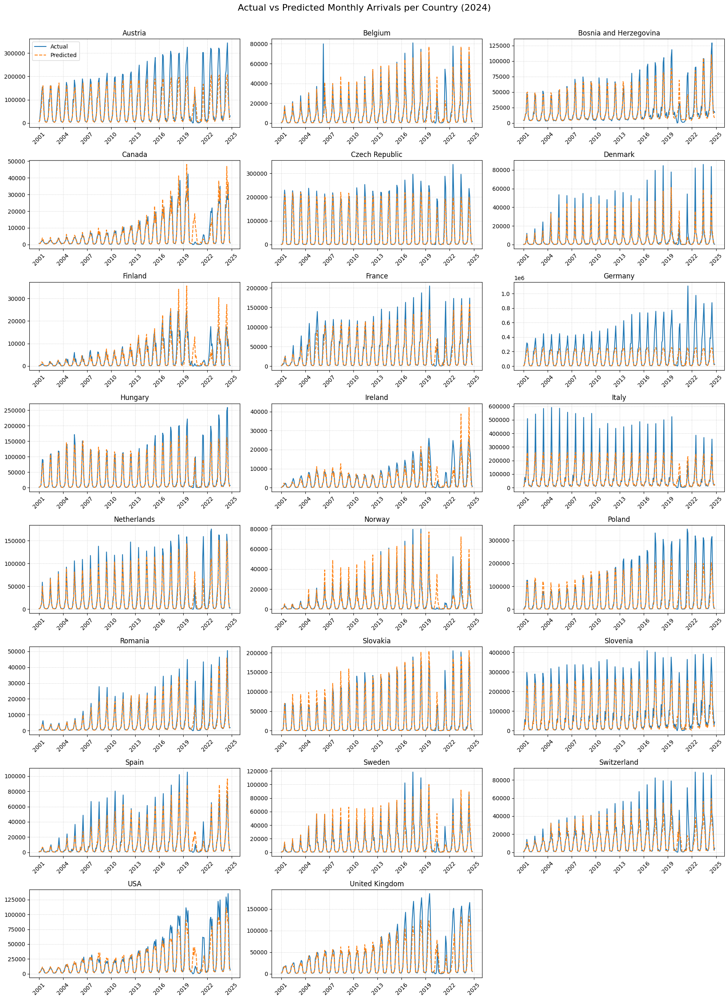

In [ ]:
# Country-level plots
countries = df_plot['country'].unique()
fig, axes = plt.subplots(len(countries) // 3 + 1, 3, figsize=(18, 3 * (len(countries) // 3 + 1)), sharex=False, sharey=False)

axes = axes.flatten()

for i, country in enumerate(countries):
    country_df = df_plot[df_plot['country'] == country].groupby('date')[['actual', 'predicted']].sum()
    ax = axes[i]
    ax.plot(country_df.index, country_df['actual'], label='Actual')
    ax.plot(country_df.index, country_df['predicted'], label='Predicted', linestyle='--')
    ax.set_title(country)
    
    # Show x-axis ticks every 3 years
    ax.xaxis.set_major_locator(mdates.YearLocator(base=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)

    # Add legend only once
    if i == 0:
        ax.legend()

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
fig.suptitle('Actual vs Predicted Monthly Arrivals per Country (2024)', fontsize=16, y=1.02)
plt.show()

In [ ]:
# df_plot: DataFrame with columns ['country', 'date', 'actual', 'predicted']
# List of countries
countries = df_plot['country'].unique()

results = []

for country in countries:
    # Subset data for this country (test set only, if you want)
    country_df = df_plot[(df_plot['country'] == country) & (df_plot['date'] > val_end)]
    
    actual = country_df['actual'].values
    pred = country_df['predicted'].values
    
    if len(actual) == 0:
        continue  # Skip countries with no data in test set
    
    mse = round(mean_squared_error(actual, pred),6)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, pred)
    mape = mean_absolute_percentage_error(actual, pred)
    r2 = r2_score(actual, pred)
    
    results.append({
        'country': country,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape,
        'R2': r2
    })

# Convert to DataFrame for easy export or display
country_metrics = pd.DataFrame(results)
print(country_metrics)

                   country           MSE           RMSE            MAE  \
0                  Austria  5.081636e+09   71285.595256   49918.328535   
1                  Belgium  6.537096e+07    8085.231123    4196.487165   
2   Bosnia and Herzegovina  1.642307e+08   12815.252438    8874.936591   
3                   Canada  1.947356e+07    4412.885448    2575.362746   
4           Czech Republic  1.393131e+09   37324.668759   19292.966149   
5                  Denmark  1.315828e+08   11470.952964    4718.637211   
6                  Finland  1.638380e+07    4047.691017    2332.584180   
7                   France  4.337233e+08   20826.025097   12390.277720   
8                  Germany  7.127464e+10  266973.101306  161100.764622   
9                  Hungary  1.225432e+09   35006.166906   18925.231006   
10                 Ireland  3.426333e+07    5853.489093    3640.333267   
11                   Italy  1.647708e+09   40591.974631   20378.707260   
12             Netherlands  6.173665e+

# Arrivals 2019 LR=0.001 Model 1

In [266]:
# Load and clean data
cool = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/df_top_cool.csv")
cool.replace('..', np.nan, inplace=True)
cool['date'] = pd.to_datetime(cool[['year', 'month']].assign(day=1))
lag_cols = [col for col in cool.columns if 'lag' in col]
cool = cool.drop(columns=lag_cols, errors='ignore')
cool = cool[~cool['country'].isin(['Russian Federation'])]

In [267]:
# Convert types
cool['year'] = pd.to_numeric(cool['year'], downcast='integer', errors='coerce')
cool['month'] = pd.to_numeric(cool['month'], downcast='integer', errors='coerce')
cool['arrivals'] = pd.to_numeric(cool['arrivals'], errors='coerce')
cool['overnights'] = pd.to_numeric(cool['overnights'], errors='coerce')
cool['unemployment_rate'] = pd.to_numeric(cool['unemployment_rate'], errors='coerce')
cool['exchange_rate'] = pd.to_numeric(cool['exchange_rate'], errors='coerce')
cool['cpi'] = pd.to_numeric(cool['cpi'], errors='coerce')
cool['eu_member'] = cool['eu_member'].astype(int)
cool['euro_adopted'] = cool['euro_adopted'].astype(int)

# Merge Google Trends data
td = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/multiTimeline.csv")
cool['date'] = pd.to_datetime(cool['date']).dt.to_period('M').dt.to_timestamp()
td['date'] = pd.to_datetime(td['date']).dt.to_period('M').dt.to_timestamp()
td_long = td.melt(id_vars='date', var_name='country', value_name='google_trends')
cool = cool.merge(td_long, on=['date', 'country'], how='left')
cool['google_trends'] = cool['google_trends'].fillna(-1)

# Sort and log-transform
cool = cool.sort_values(['country', 'date']).reset_index(drop=True)
cool = cool.drop_duplicates(subset=['country', 'date'], keep='first').reset_index(drop=True)
cool['arrivals'] = np.log1p(cool['arrivals']) 
cool['overnights'] = np.log1p(cool['overnights'])
cool['exchange_rate'] = np.log1p(cool['exchange_rate'])
cool['cpi'] = np.log1p(cool['cpi'])
cool['arrivals_next_month'] = cool.groupby('country')['arrivals'].shift(-1)

# One-hot encode month
month_names = {i: month for i, month in enumerate(['January','February','March','April','May','June','July','August','September','October','November','December'], 1)}
cool['month_name'] = cool['month'].map(month_names)
ohe_month = pd.get_dummies(cool['month_name'], prefix='month').astype(int)
cool = pd.concat([cool, ohe_month], axis=1).drop(columns=['month_name'])

# Create lags
lags = {'arrivals': [1, 3, 6, 12], 'overnights': [1, 3, 6, 12], 'cpi': [1], 'unemployment_rate': [3], 'google_trends': [1, 3]}
for var, steps in lags.items():
    for lag in steps:
        cool[f'{var}_lag_{lag}'] = cool.groupby('country')[var].shift(lag)

# Step 1: Define Schengen entry years
schengen_entry_year = {
    'Austria': 1995,
    'Belgium': 1995,
    'Czech Republic': 2007,
    'Denmark': 2001,
    'Finland': 1996,
    'France': 1995,
    'Germany': 1995,
    'Hungary': 2007,
    'Italy': 1997,
    'Netherlands': 1995,
    'Norway': 2001,
    'Poland': 2007,
    'Portugal': 1995,
    'Slovakia': 2007,
    'Slovenia': 2007,
    'Spain': 1995,
    'Sweden': 2001,
    'Switzerland': 2008,
    'Romania': 2024,}

def is_schengen_member(row):
    entry_year = schengen_entry_year.get(row['country'], np.inf)
    return int(row['year'] >= entry_year)

cool['schengen_member'] = cool.apply(is_schengen_member, axis=1).astype('int8')

# Filter and drop missing
cool.isna().sum().sort_values(ascending=False) 
cool = cool[cool['date'] >= '2001-01-01']
cool = cool[cool['date'] <= '2019-12-01']

cool = cool[cool['arrivals_next_month'].notna()].copy()

In [268]:
# Label encode country and scale numeric features
cool['country_encoded'] = LabelEncoder().fit_transform(cool['country'])
month_cols = [col for col in cool.columns if col.startswith('month_')]
X_numeric = cool[[
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'arrivals_lag_1', 'arrivals_lag_3', 'arrivals_lag_6', 'arrivals_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member','euro_adopted'] + month_cols].values
X_country_array = cool['country_encoded'].astype('int32').values
y = cool['arrivals_next_month'].values

In [269]:
# Time-based split
train_end = pd.Timestamp("2014-12-31")
val_end = pd.Timestamp("2017-12-31")
train_mask = cool['date'] <= train_end
val_mask = (cool['date'] > train_end) & (cool['date'] <= val_end)
test_mask = cool['date'] > val_end

scaler = StandardScaler()
X_num_train = scaler.fit_transform(X_numeric[train_mask])
X_num_val = scaler.transform(X_numeric[val_mask])
X_num_test = scaler.transform(X_numeric[test_mask])
X_numeric_scaled_all = scaler.transform(X_numeric)  

X_cat_train = X_country_array[train_mask.to_numpy()]
X_cat_val = X_country_array[val_mask.to_numpy()]
X_cat_test = X_country_array[test_mask.to_numpy()]
y_train = y[train_mask.to_numpy()]
y_val = y[val_mask.to_numpy()]
y_test = y[test_mask.to_numpy()]


In [270]:
# Define model4
input_numeric = Input(shape=(X_num_train.shape[1],), name="numeric_input")
input_country = Input(shape=(1,), dtype='int32', name="country_input")
n_countries = cool['country_encoded'].nunique()
embedding = Embedding(input_dim=n_countries, output_dim=10)(input_country)
embedding_flat = Flatten()(embedding)
x = Concatenate()([input_numeric, embedding_flat])
x = Dense(64, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
x = Dense(32, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
output = Dense(1)(x)
model1 = Model(inputs=[input_numeric, input_country], outputs=output)
model1.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
model1.summary()

# Train mode4
early_stop = EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=True)
history = model1.fit(
    [X_num_train, X_cat_train], y_train,
    validation_data=([X_num_val, X_cat_val], y_val),
    epochs=100, batch_size=16, callbacks=[early_stop]
)

Model: "functional_30"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ country_input       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_30        │ (None, 1, 10)     │        230 │ country_input[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ numeric_input       │ (None, 25)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_30          │ (None, 10)        │          0 │ embedding_30[0][… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_30      │ (None, 35)        │          0 │ numeric_input[0]… │
│ (Concatenate)       │                   │            │ flatten_30[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_90 (Dense)    │ (None, 64)        │      2,304 │ concatenate_30[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_90[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_60          │ (None, 64)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_91 (Dense)    │ (None, 32)        │      2,080 │ dropout_60[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_91[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_61          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_92 (Dense)    │ (None, 1)         │         33 │ dropout_61[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,031 (19.65 KB)

 Trainable params: 4,839 (18.90 KB)

 Non-trainable params: 192 (768.00 B)

Epoch 1/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - loss: 67.7775 - val_loss: 31.6445
Epoch 2/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 22.3988 - val_loss: 1.5322
Epoch 3/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.8682 - val_loss: 0.7337
Epoch 4/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 3.3002 - val_loss: 0.5032
Epoch 5/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.6980 - val_loss: 0.4413
Epoch 6/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.3971 - val_loss: 0.3308
Epoch 7/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2.0858 - val_loss: 0.3201
Epoch 8/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9076 - val_loss: 0.3460
Epoch 9/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 1.8606 - val_loss: 0.3169
Epoch 10/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.6263 - val_loss: 0.3324
Epoch 11/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5082 - val_loss: 0.2692
Epoch 12/100
242/242 ━━━━━━━━━━━━━━━━━

18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
18/18 ━━

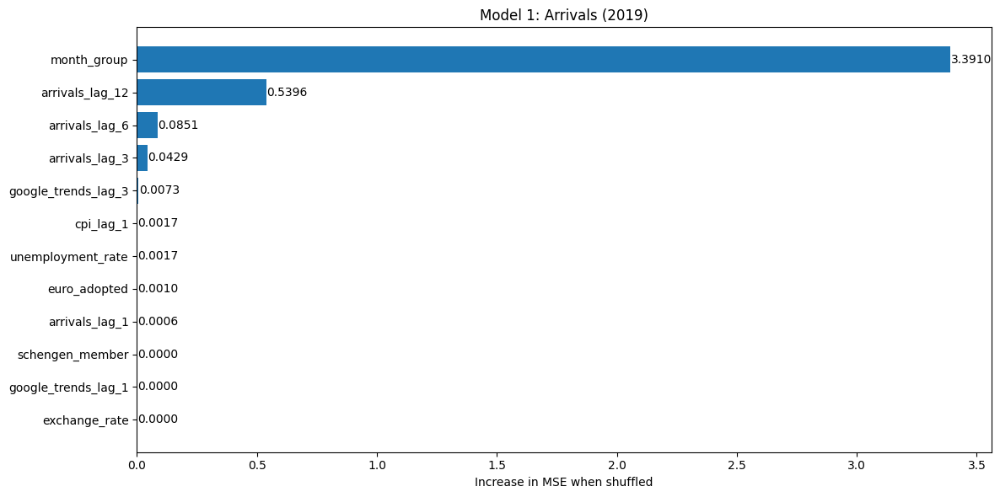

In [271]:
# Baseline predictions
baseline_preds = model1.predict([X_num_test, X_cat_test]).flatten()
baseline_mse = mean_squared_error(y_test, baseline_preds)

feature_names = [
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'arrivals_lag_1', 'arrivals_lag_3', 'arrivals_lag_6', 'arrivals_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted']+month_cols

importances = []
for i in range(X_num_test.shape[1]):
    X_permuted = X_num_test.copy()
    X_permuted[:, i] = np.random.permutation(X_permuted[:, i])
    permuted_preds = model1.predict([X_permuted, X_cat_test]).flatten()
    permuted_mse = mean_squared_error(y_test, permuted_preds)
    importances.append(max(0, permuted_mse - baseline_mse))

#Handle grouped month dummies so its not one bar for each month
month_indices = [i for i, f in enumerate(feature_names) if f.startswith('month_')]

if month_indices:
    # Safe grouped permutation
    X_month_permuted = X_num_test.copy()
    row_perm = np.random.permutation(len(X_month_permuted))
    X_month_permuted[:, month_indices] = X_month_permuted[row_perm][:, month_indices]
    month_preds = model1.predict([X_month_permuted, X_cat_test]).flatten()
    month_importance = max(0, mean_squared_error(y_test, month_preds) - baseline_mse)

else:
    month_importance = 0  # fallback if no month cols present

filtered_names = [f for i, f in enumerate(feature_names) if i not in month_indices]
filtered_importances = [imp for i, imp in enumerate(importances) if i not in month_indices]
feature_names_final = filtered_names + ['month_group']
importances_final = filtered_importances + [month_importance]
sorted_pairs = sorted(zip(importances_final, feature_names_final), reverse=True)
importances_sorted, feature_names_sorted = zip(*sorted_pairs)

plt.figure(figsize=(12, 6))
bars = plt.barh(feature_names_sorted, importances_sorted)
plt.xlabel("Increase in MSE when shuffled")
plt.title("Model 1: Arrivals (2019)")
plt.gca().invert_yaxis()

# Add labels
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.001, bar.get_y() + bar.get_height() / 2,
             f"{width:.4f}", va='center')

plt.tight_layout()
plt.show()

## Model Evaluation

121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
Train MSE: 0.0857, RMSE: 0.2927, MAE: 0.2219, MAPE: 0.0277, R²: 0.9779
Test MSE: 0.4103, RMSE: 0.6405, MAE: 0.4875, MAPE: 0.0546, R²: 0.8716


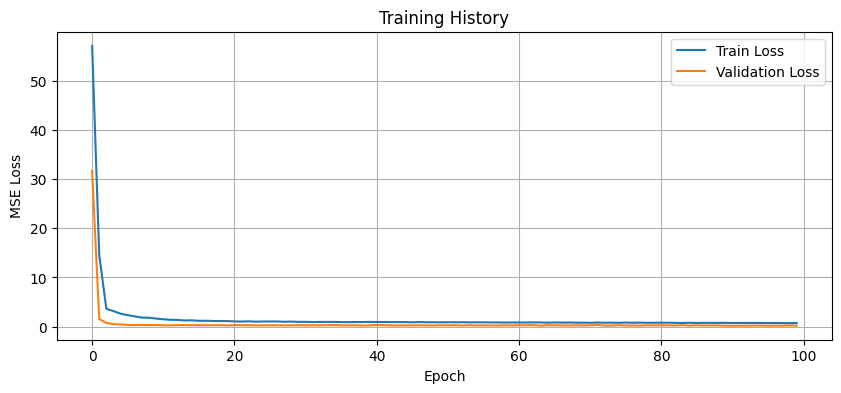

In [272]:
## Model evalauation
# Predict and flatten
train_preds = model1.predict([X_num_train, X_cat_train]).flatten()
test_preds = model1.predict([X_num_test, X_cat_test]).flatten()

# MSE
train_mse = mean_squared_error(y_train, train_preds)
test_mse = mean_squared_error(y_test, test_preds)

# RMSE
train_rmse1 = np.sqrt(train_mse)
test_rmse1 = np.sqrt(test_mse)

#MAE
train_mae1 = mean_absolute_error(y_train, train_preds)
test_mae1 = mean_absolute_error(y_test, test_preds)

# MAPE
train_mape1 = mean_absolute_percentage_error(y_train, train_preds)
test_mape1 = mean_absolute_percentage_error(y_test, test_preds)

# R-squared
train_r2_1 = r2_score(y_train, train_preds)
test_r2_1 = r2_score(y_test, test_preds)

# Print all metrics
print(f"Train MSE: {train_mse:.4f}, RMSE: {train_rmse1:.4f}, MAE: {train_mae1:.4f}, MAPE: {train_mape1:.4f}, R²: {train_r2_1:.4f}")
print(f"Test MSE: {test_mse:.4f}, RMSE: {test_rmse1:.4f}, MAE: {test_mae1:.4f}, MAPE: {test_mape1:.4f}, R²: {test_r2_1:.4f}")

# Plot training history
plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True)
plt.show()

164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


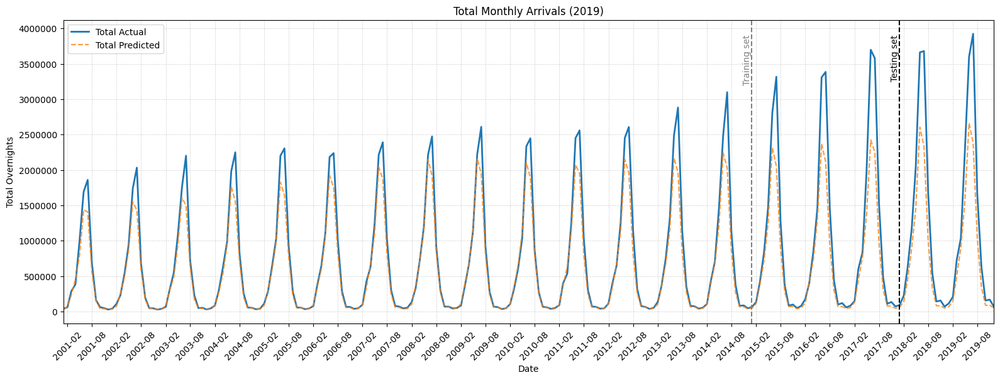

In [273]:
# Global trend plot (total actual vs predicted per month)
y_pred_all = model1.predict([X_numeric_scaled_all, X_country_array]).flatten()
y_actual_all = np.expm1(y)
y_pred_all = np.expm1(y_pred_all)
df_plot = cool.copy()
df_plot['actual'] = y_actual_all
df_plot['predicted'] = y_pred_all
monthly_totals_all = df_plot.groupby('date')[['actual', 'predicted']].sum()

plt.figure(figsize=(16, 6))
plt.plot(monthly_totals_all.index, monthly_totals_all['actual'], label='Total Actual', linewidth=2)
plt.plot(monthly_totals_all.index, monthly_totals_all['predicted'], label='Total Predicted', linestyle='--', alpha=0.8)
plt.title("Total Monthly Arrivals (2019)")
plt.xlabel("Date")
plt.ylabel("Total Overnights")
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='y')
plt.legend()
plt.tight_layout()
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.xlim(monthly_totals_all.index.min(), monthly_totals_all.index.max())
plt.axvline(x=train_end, color='gray', linestyle='--', linewidth=1.5, label='Train/Val Split')
plt.axvline(x=val_end, color='black', linestyle='--', linewidth=1.5, label='Val/Test Split')
plt.text(train_end, plt.ylim()[1]*0.95, 'Training set', rotation=90, ha='right', va='top', color='gray')
plt.text(val_end, plt.ylim()[1]*0.95, 'Testing set', rotation=90, ha='right', va='top', color='black')
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)
plt.show()

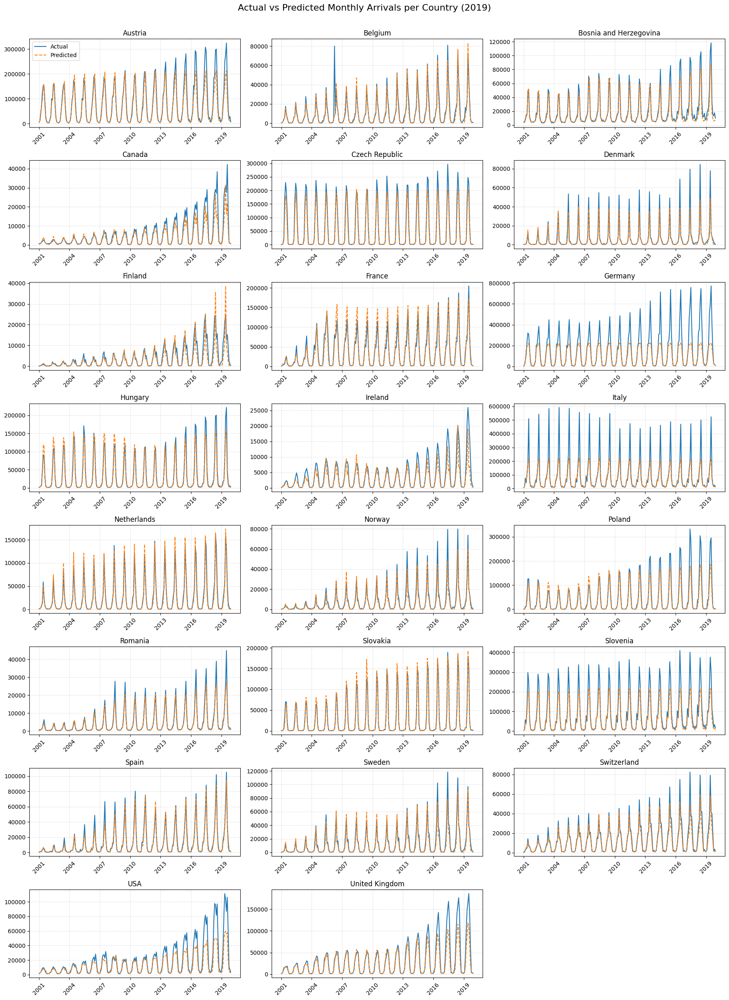

In [274]:
# Country-level plots
countries = df_plot['country'].unique()
fig, axes = plt.subplots(len(countries) // 3 + 1, 3, figsize=(18, 3 * (len(countries) // 3 + 1)), sharex=False, sharey=False)

axes = axes.flatten()

for i, country in enumerate(countries):
    country_df = df_plot[df_plot['country'] == country].groupby('date')[['actual', 'predicted']].sum()
    ax = axes[i]
    ax.plot(country_df.index, country_df['actual'], label='Actual')
    ax.plot(country_df.index, country_df['predicted'], label='Predicted', linestyle='--')
    ax.set_title(country)
    
    # Show x-axis ticks every 3 years
    ax.xaxis.set_major_locator(mdates.YearLocator(base=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)

    # Add legend only once
    if i == 0:
        ax.legend()

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
fig.suptitle('Actual vs Predicted Monthly Arrivals per Country (2019)', fontsize=16, y=1.02)
plt.show()

In [275]:
# df_plot: DataFrame with columns ['country', 'date', 'actual', 'predicted']
# List of countries
countries = df_plot['country'].unique()

results = []

for country in countries:
    # Subset data for this country (test set only, if you want)
    country_df = df_plot[(df_plot['country'] == country) & (df_plot['date'] > val_end)]
    
    actual = country_df['actual'].values
    pred = country_df['predicted'].values
    
    if len(actual) == 0:
        continue  # Skip countries with no data in test set
    
    mse = round(mean_squared_error(actual, pred),6)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, pred)
    mape = mean_absolute_percentage_error(actual, pred)
    r2 = r2_score(actual, pred)
    
    results.append({
        'country': country,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape,
        'R2': r2
    })

# Convert to DataFrame for easy export or display
country_metrics = pd.DataFrame(results)
print(country_metrics)

                   country           MSE           RMSE            MAE  \
0                  Austria  2.679614e+09   51764.985675   37030.900614   
1                  Belgium  2.492627e+07    4992.621074    3350.236781   
2   Bosnia and Herzegovina  1.842222e+08   13572.847560   10908.470133   
3                   Canada  7.779840e+07    8820.339876    5862.227914   
4           Czech Republic  5.728626e+08   23934.548834   13299.749715   
5                  Denmark  9.971241e+07    9985.609978    4399.104020   
6                  Finland  4.199998e+07    6480.738915    5031.262491   
7                   France  1.101853e+08   10496.917985    7294.615351   
8                  Germany  4.560198e+10  213546.207054  127152.686279   
9                  Hungary  6.498556e+08   25492.265914   13569.599833   
10                 Ireland  3.477323e+07    5896.883205    3741.162018   
11                   Italy  7.621585e+09   87301.691953   31303.574341   
12             Netherlands  1.198660e+

# Non-schengen

In [350]:
# Load data
cool = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/df_top_cool.csv")
cool.replace('..', np.nan, inplace=True)
cool['date'] = pd.to_datetime(cool[['year', 'month']].assign(day=1))
cool = cool[~cool['country'].isin(['Russian Federation'])]

# Type conversions
cool['year'] = pd.to_numeric(cool['year'], downcast='integer', errors='coerce')
cool['month'] = pd.to_numeric(cool['month'], downcast='integer', errors='coerce')
cool['arrivals'] = pd.to_numeric(cool['arrivals'], errors='coerce')
cool['overnights'] = pd.to_numeric(cool['overnights'], errors='coerce')
cool['unemployment_rate'] = pd.to_numeric(cool['unemployment_rate'], errors='coerce')
cool['exchange_rate'] = pd.to_numeric(cool['exchange_rate'], errors='coerce')
cool['cpi'] = pd.to_numeric(cool['cpi'], errors='coerce')
cool['eu_member'] = cool['eu_member'].astype(int)

# Add Schengen and Euro info
schengen_entry_year = {
    'Austria': 1995, 'Belgium': 1995, 'Czech Republic': 2007, 'Denmark': 2001,
    'Finland': 1996, 'France': 1995, 'Germany': 1995, 'Hungary': 2007,
    'Italy': 1997, 'Netherlands': 1995, 'Norway': 2001, 'Poland': 2007,
    'Portugal': 1995, 'Slovakia': 2007, 'Slovenia': 2007, 'Spain': 1995,
    'Sweden': 2001, 'Switzerland': 2008, 'Romania': 2024,
}

cool['schengen_member'] = cool.apply(lambda row: int(row['year'] >= schengen_entry_year.get(row['country'], np.inf)), axis=1).astype('int8')

# Add Google Trends
td = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/multiTimeline.csv")
td['date'] = pd.to_datetime(td['date']).dt.to_period('M').dt.to_timestamp()
td_long = td.melt(id_vars='date', var_name='country', value_name='google_trends')
cool['date'] = pd.to_datetime(cool['date']).dt.to_period('M').dt.to_timestamp()
cool = cool.merge(td_long, on=['date', 'country'], how='left')
cool['google_trends'] = cool['google_trends'].fillna(-1)

# Log transform + lags
cool = cool.sort_values(['country', 'date']).drop_duplicates(subset=['country', 'date']).reset_index(drop=True)
cool['arrivals'] = np.log1p(cool['arrivals'])
cool['overnights'] = np.log1p(cool['overnights'])
cool['exchange_rate'] = np.log1p(cool['exchange_rate'])
cool['cpi'] = np.log1p(cool['cpi'])

cool['arrivals_next_month'] = cool.groupby('country')['arrivals'].shift(-1)

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}
cool['month_name'] = cool['month'].map(month_names)
ohe_month = pd.get_dummies(cool['month_name'], prefix='month').astype(int)
cool = pd.concat([cool.drop(columns=['month_name']), ohe_month], axis=1)

cool['arrivals_lag_1'] = cool.groupby('country')['arrivals'].shift(1)
cool['arrivals_lag_3'] = cool.groupby('country')['arrivals'].shift(3)
cool['arrivals_lag_6'] = cool.groupby('country')['arrivals'].shift(6)
cool['arrivals_lag_12'] = cool.groupby('country')['arrivals'].shift(12)
cool['cpi_lag_1'] = cool.groupby('country')['cpi'].shift(1)
cool['unemp_rate_lag_3'] = cool.groupby('country')['unemployment_rate'].shift(3)
cool['google_trends_lag_1'] = cool.groupby('country')['google_trends'].shift(1)
cool['google_trends_lag_3'] = cool.groupby('country')['google_trends'].shift(3)

cool = cool[cool['date'] >= '2001-01-01']
cool_ns = cool[cool['country'].isin(['Ireland','Bosnia and Herzegovina', 'USA', 'United Kingdom', 'Canada'])].copy()
cool_ns = cool_ns[cool_ns['arrivals_next_month'].notna()].copy()

cool_ns['country_encoded'] = LabelEncoder().fit_transform(cool_ns['country'])
month_cols = [col for col in cool_ns.columns if col.startswith('month_')]

X_numeric = cool_ns[[
    'unemp_rate_lag_3', 'exchange_rate', 'cpi_lag_1',
    'arrivals_lag_1', 'arrivals_lag_3', 'arrivals_lag_6', 'arrivals_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted'
] + month_cols].values

X_country_array = cool_ns['country_encoded'].astype('int32').values
y = cool_ns['arrivals_next_month'].values

train_end = pd.Timestamp("2016-12-31")
val_end = pd.Timestamp("2020-12-31")
train_mask = cool_ns['date'] <= train_end
val_mask = (cool_ns['date'] > train_end) & (cool_ns['date'] <= val_end)
test_mask = cool_ns['date'] > val_end

scaler = StandardScaler()
X_num_train = scaler.fit_transform(X_numeric[train_mask])
X_num_val = scaler.transform(X_numeric[val_mask])
X_num_test = scaler.transform(X_numeric[test_mask])
X_numeric_scaled_all = scaler.transform(X_numeric)

X_cat_train = X_country_array[train_mask.to_numpy()]
X_cat_val = X_country_array[val_mask.to_numpy()]
X_cat_test = X_country_array[test_mask.to_numpy()]
y_train = y[train_mask.to_numpy()]
y_val = y[val_mask.to_numpy()]
y_test = y[test_mask.to_numpy()]

input_numeric = Input(shape=(X_num_train.shape[1],), name="numeric_input")
input_country = Input(shape=(1,), dtype='int32', name="country_input")
embedding = Embedding(input_dim=len(np.unique(X_country_array)), output_dim=5)(input_country)
embedding_flat = Flatten()(embedding)
x = Concatenate()([input_numeric, embedding_flat])
x = Dense(64, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
x = Dense(32, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
output = Dense(1)(x)

model0 = Model(inputs=[input_numeric, input_country], outputs=output)
model0.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

early_stop = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)
history = model0.fit(
    [X_num_train, X_cat_train], y_train,
    validation_data=([X_num_val, X_cat_val], y_val),
    epochs=100, batch_size=16)

model0.summary()


Epoch 1/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 70.2320 - val_loss: 67.7599
Epoch 2/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 62.0043 - val_loss: 57.4380
Epoch 3/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 52.5921 - val_loss: 44.6008
Epoch 4/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 41.1542 - val_loss: 29.7536
Epoch 5/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 27.9099 - val_loss: 17.7265
Epoch 6/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 16.7578 - val_loss: 10.7735
Epoch 7/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 8.8176 - val_loss: 4.5991
Epoch 8/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 4.9372 - val_loss: 2.4491
Epoch 9/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 3.5004 - val_loss: 2.2870
Epoch 10/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 3.5081 - val_loss: 2.2256
Epoch 11/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 2.7785 - val_loss: 2.1660
Epoch 12/100
60/60 ━━━━━━━━━━━━━━━━━━━

Model: "functional_38"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ country_input       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_38        │ (None, 1, 5)      │         25 │ country_input[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ numeric_input       │ (None, 25)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_38          │ (None, 5)         │          0 │ embedding_38[0][… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_38      │ (None, 30)        │          0 │ numeric_input[0]… │
│ (Concatenate)       │                   │            │ flatten_38[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_114 (Dense)   │ (None, 64)        │      1,984 │ concatenate_38[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_114[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_76          │ (None, 64)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_115 (Dense)   │ (None, 32)        │      2,080 │ dropout_76[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_115[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_77          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_116 (Dense)   │ (None, 1)         │         33 │ dropout_77[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 13,136 (51.32 KB)

 Trainable params: 4,314 (16.85 KB)

 Non-trainable params: 192 (768.00 B)

 Optimizer params: 8,630 (33.71 KB)

## Model Evaluation

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Train MSE: 0.0663, RMSE: 0.2575, MAE: 0.1989, MAPE: 0.0252, R²: 0.9742
Test MSE: 0.5710, RMSE: 0.7556, MAE: 0.6125, MAPE: 0.0716, R²: 0.8293


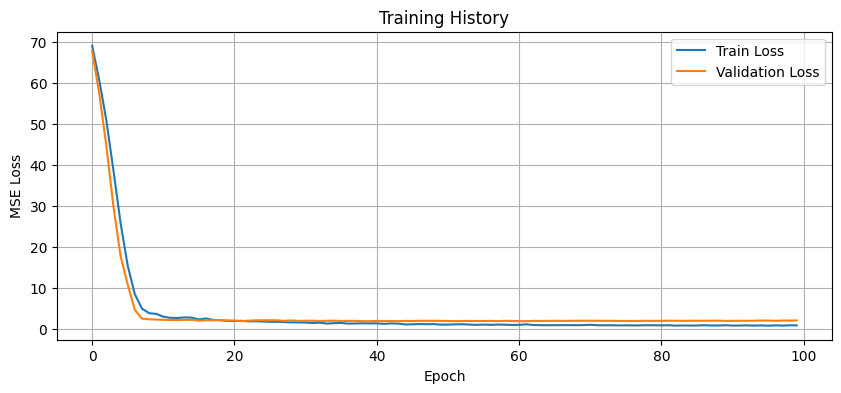

In [351]:
## Model evalauation
# Predict and flatten
train_preds = model0.predict([X_num_train, X_cat_train]).flatten()
test_preds = model0.predict([X_num_test, X_cat_test]).flatten()

# MSE
train_mse = mean_squared_error(y_train, train_preds)
test_mse = mean_squared_error(y_test, test_preds)

# RMSE
train_rmse0 = np.sqrt(train_mse)
test_rmse0 = np.sqrt(test_mse)

#MAE
train_mae0 = mean_absolute_error(y_train, train_preds)
test_mae0 = mean_absolute_error(y_test, test_preds)

# MAPE
train_mape0 = mean_absolute_percentage_error(y_train, train_preds)
test_mape0 = mean_absolute_percentage_error(y_test, test_preds)

# R-squared
train_r2_0 = r2_score(y_train, train_preds)
test_r2_0 = r2_score(y_test, test_preds)

# Print all metrics
print(f"Train MSE: {train_mse:.4f}, RMSE: {train_rmse0:.4f}, MAE: {train_mae0:.4f}, MAPE: {train_mape0:.4f}, R²: {train_r2_0:.4f}")
print(f"Test MSE: {test_mse:.4f}, RMSE: {test_rmse0:.4f}, MAE: {test_mae0:.4f}, MAPE: {test_mape0:.4f}, R²: {test_r2_0:.4f}")

# Plot training history
plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True)
plt.show()

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


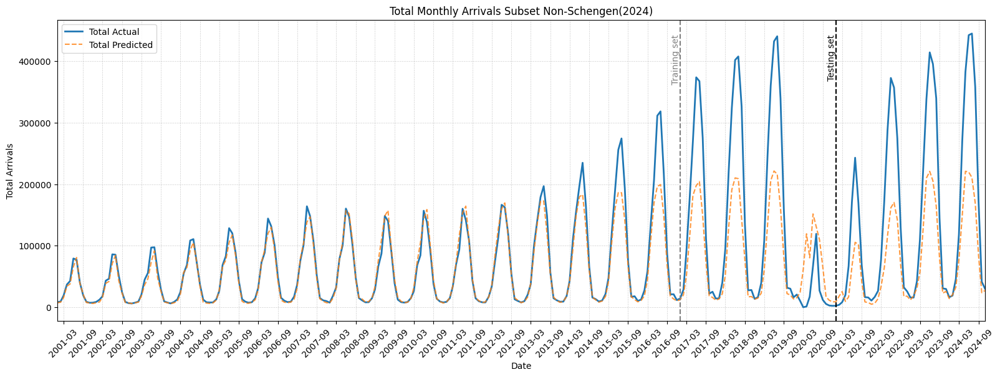

In [354]:
# Global trend plot (total actual vs predicted per month)
y_pred_all = model0.predict([X_numeric_scaled_all, X_country_array]).flatten()
y_actual_all = np.expm1(y)
y_pred_all = np.expm1(y_pred_all)
df_plot = cool_ns.copy()
df_plot['actual'] = y_actual_all
df_plot['predicted'] = y_pred_all
monthly_totals_all = df_plot.groupby('date')[['actual', 'predicted']].sum()

plt.figure(figsize=(16, 6))
plt.plot(monthly_totals_all.index, monthly_totals_all['actual'], label='Total Actual', linewidth=2)
plt.plot(monthly_totals_all.index, monthly_totals_all['predicted'], label='Total Predicted', linestyle='--', alpha=0.8)
plt.title("Total Monthly Arrivals Subset Non-Schengen(2024)")
plt.xlabel("Date")
plt.ylabel("Total Arrivals")
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='y')
plt.legend()
plt.tight_layout()
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.xlim(monthly_totals_all.index.min(), monthly_totals_all.index.max())
plt.axvline(x=train_end, color='gray', linestyle='--', linewidth=1.5, label='Train/Val Split')
plt.axvline(x=val_end, color='black', linestyle='--', linewidth=1.5, label='Val/Test Split')
plt.text(train_end, plt.ylim()[1]*0.95, 'Training set', rotation=90, ha='right', va='top', color='gray')
plt.text(val_end, plt.ylim()[1]*0.95, 'Testing set', rotation=90, ha='right', va='top', color='black')
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)
plt.show()

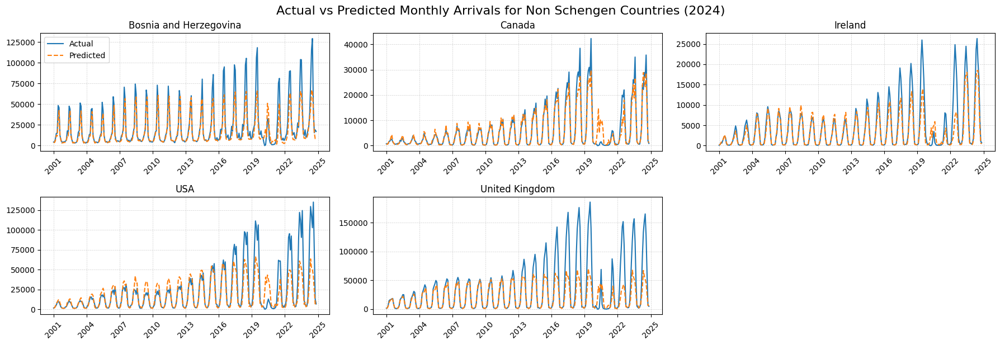

In [355]:
# Country-level plots
countries = df_plot['country'].unique()
fig, axes = plt.subplots(len(countries) // 3 + 1, 3, figsize=(18, 3 * (len(countries) // 3 + 1)), sharex=False, sharey=False)

axes = axes.flatten()

for i, country in enumerate(countries):
    country_df = df_plot[df_plot['country'] == country].groupby('date')[['actual', 'predicted']].sum()
    ax = axes[i]
    ax.plot(country_df.index, country_df['actual'], label='Actual')
    ax.plot(country_df.index, country_df['predicted'], label='Predicted', linestyle='--')
    ax.set_title(country)
    
    # Show x-axis ticks every 3 years
    ax.xaxis.set_major_locator(mdates.YearLocator(base=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)

    # Add legend only once
    if i == 0:
        ax.legend()

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
fig.suptitle('Actual vs Predicted Monthly Arrivals for Non Schengen Countries (2024)', fontsize=16, y=1.02)
plt.show()

In [ ]:
# df_plot: DataFrame with columns ['country', 'date', 'actual', 'predicted']
# List of countries
countries = df_plot['country'].unique()

results = []

for country in countries:
    # Subset data for this country (test set only, if you want)
    country_df = df_plot[(df_plot['country'] == country) & (df_plot['date'] > val_end)]
    
    actual = country_df['actual'].values
    pred = country_df['predicted'].values
    
    if len(actual) == 0:
        continue  # Skip countries with no data in test set
    
    mse = round(mean_squared_error(actual, pred),6)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, pred)
    mape = mean_absolute_percentage_error(actual, pred)
    r2 = r2_score(actual, pred)
    
    results.append({
        'country': country,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape,
        'R2': r2
    })

# Convert to DataFrame for easy export or display
country_metrics = pd.DataFrame(results)
print(country_metrics)

                  country           MSE          RMSE           MAE      MAPE  \
0  Bosnia and Herzegovina  4.089451e+08  20222.391154  13250.893027  0.470344   
1                  Canada  1.519023e+07   3897.463996   2464.991178  0.581352   
2                 Ireland  2.961782e+07   5442.225958   3381.523684  0.592970   
3                     USA  1.114507e+09  33384.228835  23627.993380  0.564387   
4          United Kingdom  2.290262e+09  47856.685346  31533.607595  0.891014   

         R2  
0  0.637028  
1  0.866758  
2  0.588191  
3  0.421547  
4  0.268385  


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
8/8 ━━━━━━━━

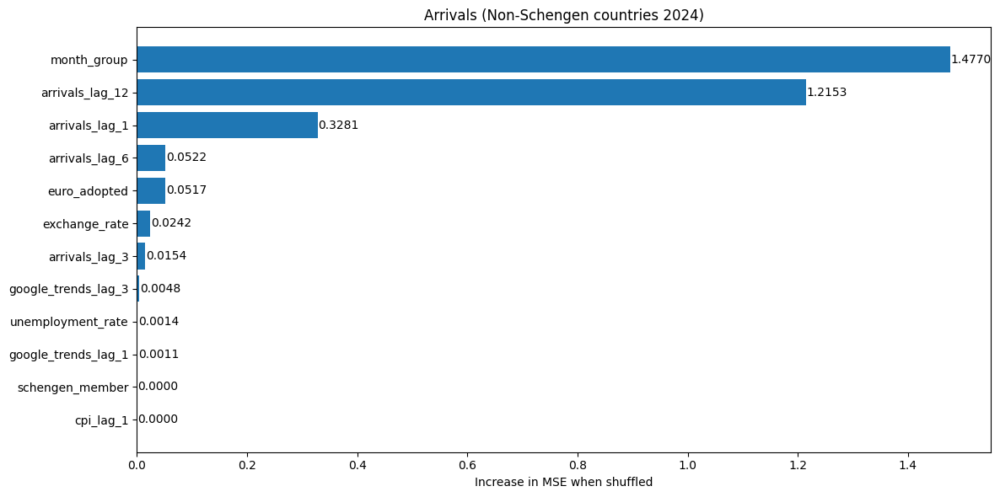

In [353]:
# Baseline predictions
baseline_preds = model0.predict([X_num_test, X_cat_test]).flatten()
baseline_mse = mean_squared_error(y_test, baseline_preds)

feature_names = [
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'arrivals_lag_1', 'arrivals_lag_3', 'arrivals_lag_6', 'arrivals_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted']+month_cols

importances = []
for i in range(X_num_test.shape[1]):
    X_permuted = X_num_test.copy()
    X_permuted[:, i] = np.random.permutation(X_permuted[:, i])
    permuted_preds = model0.predict([X_permuted, X_cat_test]).flatten()
    permuted_mse = mean_squared_error(y_test, permuted_preds)
    importances.append(max(0, permuted_mse - baseline_mse))


#Handle grouped month dummies so its not one bar for each month
month_indices = [i for i, f in enumerate(feature_names) if f.startswith('month_')]

if month_indices:
    # Safe grouped permutation
    X_month_permuted = X_num_test.copy()
    row_perm = np.random.permutation(len(X_month_permuted))
    X_month_permuted[:, month_indices] = X_month_permuted[row_perm][:, month_indices]
    month_preds = model0.predict([X_month_permuted, X_cat_test]).flatten()
    month_importance = mean_squared_error(y_test, month_preds) - baseline_mse
else:
    month_importance = 0  # fallback if no month cols present

filtered_names = [f for i, f in enumerate(feature_names) if i not in month_indices]
filtered_importances = [imp for i, imp in enumerate(importances) if i not in month_indices]
feature_names_final = filtered_names + ['month_group']
importances_final = filtered_importances + [month_importance]
sorted_pairs = sorted(zip(importances_final, feature_names_final), reverse=True)
importances_sorted, feature_names_sorted = zip(*sorted_pairs)

plt.figure(figsize=(12, 6))
bars = plt.barh(feature_names_sorted, importances_sorted)
plt.xlabel("Increase in MSE when shuffled")
plt.title("Arrivals (Non-Schengen countries 2024)")
plt.gca().invert_yaxis()

# Add labels
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.001, bar.get_y() + bar.get_height() / 2,
             f"{width:.4f}", va='center')

plt.tight_layout()
plt.show()

# Subset of countries

In [362]:
# Load data
cool = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/df_top_cool.csv")
cool.replace('..', np.nan, inplace=True)
cool['date'] = pd.to_datetime(cool[['year', 'month']].assign(day=1))
cool = cool[~cool['country'].isin(['Russian Federation'])]

# Type conversions
cool['year'] = pd.to_numeric(cool['year'], downcast='integer', errors='coerce')
cool['month'] = pd.to_numeric(cool['month'], downcast='integer', errors='coerce')
cool['arrivals'] = pd.to_numeric(cool['arrivals'], errors='coerce')
cool['overnights'] = pd.to_numeric(cool['overnights'], errors='coerce')
cool['unemployment_rate'] = pd.to_numeric(cool['unemployment_rate'], errors='coerce')
cool['exchange_rate'] = pd.to_numeric(cool['exchange_rate'], errors='coerce')
cool['cpi'] = pd.to_numeric(cool['cpi'], errors='coerce')
cool['eu_member'] = cool['eu_member'].astype(int)

# Add Schengen and Euro info
schengen_entry_year = {
    'Austria': 1995, 'Belgium': 1995, 'Czech Republic': 2007, 'Denmark': 2001,
    'Finland': 1996, 'France': 1995, 'Germany': 1995, 'Hungary': 2007,
    'Italy': 1997, 'Netherlands': 1995, 'Norway': 2001, 'Poland': 2007,
    'Portugal': 1995, 'Slovakia': 2007, 'Slovenia': 2007, 'Spain': 1995,
    'Sweden': 2001, 'Switzerland': 2008, 'Romania': 2024,
}


cool['schengen_member'] = cool.apply(lambda row: int(row['year'] >= schengen_entry_year.get(row['country'], np.inf)), axis=1).astype('int8')

# Add Google Trends
td = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/multiTimeline.csv")
td['date'] = pd.to_datetime(td['date']).dt.to_period('M').dt.to_timestamp()
td_long = td.melt(id_vars='date', var_name='country', value_name='google_trends')
cool['date'] = pd.to_datetime(cool['date']).dt.to_period('M').dt.to_timestamp()
cool = cool.merge(td_long, on=['date', 'country'], how='left')
cool['google_trends'] = cool['google_trends'].fillna(-1)

# Log transform + lags
cool = cool.sort_values(['country', 'date']).drop_duplicates(subset=['country', 'date']).reset_index(drop=True)
cool['arrivals'] = np.log1p(cool['arrivals'])
cool['overnights'] = np.log1p(cool['overnights'])
cool['exchange_rate'] = np.log1p(cool['exchange_rate'])
cool['cpi'] = np.log1p(cool['cpi'])

cool['arrivals_next_month'] = cool.groupby('country')['arrivals'].shift(-1)

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}
cool['month_name'] = cool['month'].map(month_names)
ohe_month = pd.get_dummies(cool['month_name'], prefix='month').astype(int)
cool = pd.concat([cool.drop(columns=['month_name']), ohe_month], axis=1)

cool['arrivals_lag_1'] = cool.groupby('country')['arrivals'].shift(1)
cool['arrivals_lag_3'] = cool.groupby('country')['arrivals'].shift(3)
cool['arrivals_lag_6'] = cool.groupby('country')['arrivals'].shift(6)
cool['arrivals_lag_12'] = cool.groupby('country')['arrivals'].shift(12)
cool['cpi_lag_1'] = cool.groupby('country')['cpi'].shift(1)
cool['unemp_rate_lag_3'] = cool.groupby('country')['unemployment_rate'].shift(3)
cool['google_trends_lag_1'] = cool.groupby('country')['google_trends'].shift(1)
cool['google_trends_lag_3'] = cool.groupby('country')['google_trends'].shift(3)

cool = cool[cool['date'] >= '2001-01-01']
cool_sub = cool[cool['country'].isin(['Germany', 'Italy', 'Poland', 'Slovenia', 'Switzerland'])].copy()
cool_sub = cool_sub[cool_sub['arrivals_next_month'].notna()].copy()

cool_sub['country_encoded'] = LabelEncoder().fit_transform(cool_sub['country'])
month_cols = [col for col in cool_sub.columns if col.startswith('month_')]

X_numeric = cool_sub[[
    'unemp_rate_lag_3', 'exchange_rate', 'cpi_lag_1',
    'arrivals_lag_1', 'arrivals_lag_3', 'arrivals_lag_6', 'arrivals_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted'
] + month_cols].values

X_country_array = cool_sub['country_encoded'].astype('int32').values
y = cool_sub['arrivals_next_month'].values

train_end = pd.Timestamp("2016-12-31")
val_end = pd.Timestamp("2020-12-31")
train_mask = cool_sub['date'] <= train_end
val_mask = (cool_sub['date'] > train_end) & (cool_sub['date'] <= val_end)
test_mask = cool_sub['date'] > val_end

scaler = StandardScaler()
X_num_train = scaler.fit_transform(X_numeric[train_mask.to_numpy()])
X_num_val = scaler.transform(X_numeric[val_mask.to_numpy()])
X_num_test = scaler.transform(X_numeric[test_mask.to_numpy()])
X_numeric_scaled_all = scaler.transform(X_numeric)

X_cat_train = X_country_array[train_mask.to_numpy()]
X_cat_val = X_country_array[val_mask.to_numpy()]
X_cat_test = X_country_array[test_mask.to_numpy()]
y_train = y[train_mask.to_numpy()]
y_val = y[val_mask.to_numpy()]
y_test = y[test_mask.to_numpy()]

input_numeric = Input(shape=(X_num_train.shape[1],), name="numeric_input")
input_country = Input(shape=(1,), dtype='int32', name="country_input")
embedding = Embedding(input_dim=len(np.unique(X_country_array)), output_dim=5)(input_country)
embedding_flat = Flatten()(embedding)
x = Concatenate()([input_numeric, embedding_flat])
x = Dense(64, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
x = Dense(32, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
output = Dense(1)(x)

model0 = Model(inputs=[input_numeric, input_country], outputs=output)
model0.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

early_stop = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)
history = model0.fit(
    [X_num_train, X_cat_train], y_train,
    validation_data=([X_num_val, X_cat_val], y_val),
    epochs=100, batch_size=16)

model0.summary()


Epoch 1/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 9s 17ms/step - loss: 99.8589 - val_loss: 87.8250
Epoch 2/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 89.2531 - val_loss: 79.5005
Epoch 3/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 78.0134 - val_loss: 64.5254
Epoch 4/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 64.2394 - val_loss: 46.4489
Epoch 5/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 48.8235 - val_loss: 31.7959
Epoch 6/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 30.2262 - val_loss: 16.8680
Epoch 7/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 17.0672 - val_loss: 8.3088
Epoch 8/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 9.8194 - val_loss: 3.9473
Epoch 9/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.7126 - val_loss: 2.6425
Epoch 10/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.5960 - val_loss: 2.3715
Epoch 11/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.9489 - val_loss: 2.1418
Epoch 12/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/s

Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ country_input       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_40        │ (None, 1, 5)      │         25 │ country_input[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ numeric_input       │ (None, 25)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_40          │ (None, 5)         │          0 │ embedding_40[0][… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_40      │ (None, 30)        │          0 │ numeric_input[0]… │
│ (Concatenate)       │                   │            │ flatten_40[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_120 (Dense)   │ (None, 64)        │      1,984 │ concatenate_40[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_120[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_80          │ (None, 64)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_121 (Dense)   │ (None, 32)        │      2,080 │ dropout_80[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_121[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_81          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_122 (Dense)   │ (None, 1)         │         33 │ dropout_81[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 13,136 (51.32 KB)

 Trainable params: 4,314 (16.85 KB)

 Non-trainable params: 192 (768.00 B)

 Optimizer params: 8,630 (33.71 KB)

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
8/8 ━━━━━━━━

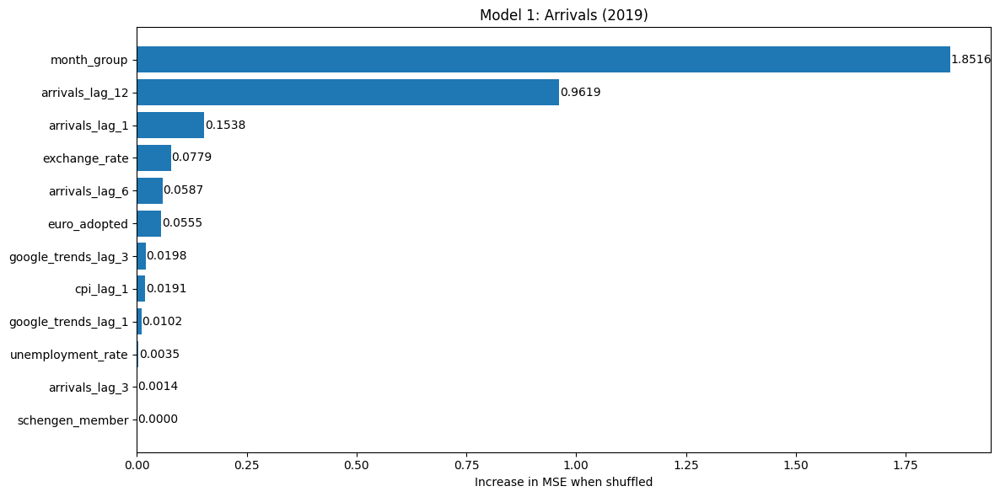

In [363]:
# Baseline predictions
baseline_preds = model0.predict([X_num_test, X_cat_test]).flatten()
baseline_mse = mean_squared_error(y_test, baseline_preds)

feature_names = [
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'arrivals_lag_1', 'arrivals_lag_3', 'arrivals_lag_6', 'arrivals_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted']+month_cols

importances = []
for i in range(X_num_test.shape[1]):
    X_permuted = X_num_test.copy()
    X_permuted[:, i] = np.random.permutation(X_permuted[:, i])
    permuted_preds = model0.predict([X_permuted, X_cat_test]).flatten()
    permuted_mse = mean_squared_error(y_test, permuted_preds)
    importances.append(permuted_mse - baseline_mse)

#Handle grouped month dummies so its not one bar for each month
month_indices = [i for i, f in enumerate(feature_names) if f.startswith('month_')]

if month_indices:
    # Safe grouped permutation
    X_month_permuted = X_num_test.copy()
    row_perm = np.random.permutation(len(X_month_permuted))
    X_month_permuted[:, month_indices] = X_month_permuted[row_perm][:, month_indices]
    month_preds = model0.predict([X_month_permuted, X_cat_test]).flatten()
    month_importance = mean_squared_error(y_test, month_preds) - baseline_mse
else:
    month_importance = 0  # fallback if no month cols present

filtered_names = [f for i, f in enumerate(feature_names) if i not in month_indices]
filtered_importances = [imp for i, imp in enumerate(importances) if i not in month_indices]
feature_names_final = filtered_names + ['month_group']
importances_final = filtered_importances + [month_importance]
sorted_pairs = sorted(zip(importances_final, feature_names_final), reverse=True)
importances_sorted, feature_names_sorted = zip(*sorted_pairs)

plt.figure(figsize=(12, 6))
bars = plt.barh(feature_names_sorted, importances_sorted)
plt.xlabel("Increase in MSE when shuffled")
plt.title("Model 1: Arrivals (2019)")
plt.gca().invert_yaxis()

# Add labels
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.001, bar.get_y() + bar.get_height() / 2,
             f"{width:.4f}", va='center')

plt.tight_layout()
plt.show()

## Model Evaluation

23/30 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Train MSE: 0.0673, RMSE: 0.2595, MAE: 0.2090, MAPE: 0.0223, R²: 0.9806
Test MSE: 0.4528, RMSE: 0.6729, MAE: 0.5146, MAPE: 0.0503, R²: 0.8526


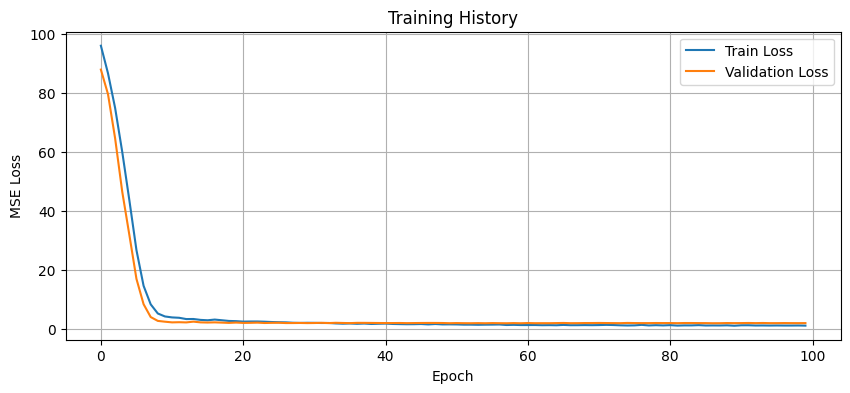

In [364]:
## Model evalauation
# Predict and flatten
train_preds = model0.predict([X_num_train, X_cat_train]).flatten()
test_preds = model0.predict([X_num_test, X_cat_test]).flatten()

# MSE
train_mse = mean_squared_error(y_train, train_preds)
test_mse = mean_squared_error(y_test, test_preds)

# RMSE
train_rmse0 = np.sqrt(train_mse)
test_rmse0 = np.sqrt(test_mse)

#MAE
train_mae0 = mean_absolute_error(y_train, train_preds)
test_mae0 = mean_absolute_error(y_test, test_preds)

# MAPE
train_mape0 = mean_absolute_percentage_error(y_train, train_preds)
test_mape0 = mean_absolute_percentage_error(y_test, test_preds)

# R-squared
train_r2_0 = r2_score(y_train, train_preds)
test_r2_0 = r2_score(y_test, test_preds)

# Print all metrics
print(f"Train MSE: {train_mse:.4f}, RMSE: {train_rmse0:.4f}, MAE: {train_mae0:.4f}, MAPE: {train_mape0:.4f}, R²: {train_r2_0:.4f}")
print(f"Test MSE: {test_mse:.4f}, RMSE: {test_rmse0:.4f}, MAE: {test_mae0:.4f}, MAPE: {test_mape0:.4f}, R²: {test_r2_0:.4f}")

# Plot training history
plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True)
plt.show()

45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


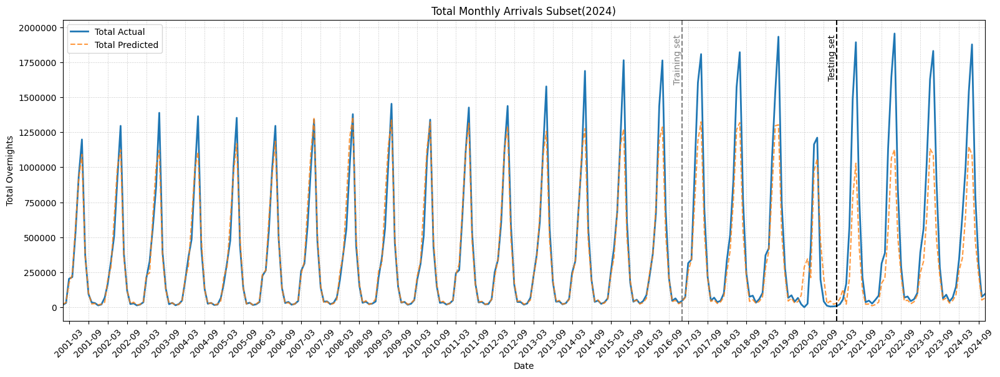

In [365]:
# Global trend plot (total actual vs predicted per month)

y_pred_all = model0.predict([X_numeric_scaled_all, X_country_array]).flatten()
y_actual_all = np.expm1(y)
y_pred_all = np.expm1(y_pred_all)
df_plot = cool_sub.copy()
df_plot['actual'] = y_actual_all
df_plot['predicted'] = y_pred_all
monthly_totals_all = df_plot.groupby('date')[['actual', 'predicted']].sum()

plt.figure(figsize=(16, 6))
plt.plot(monthly_totals_all.index, monthly_totals_all['actual'], label='Total Actual', linewidth=2)
plt.plot(monthly_totals_all.index, monthly_totals_all['predicted'], label='Total Predicted', linestyle='--', alpha=0.8)
plt.title("Total Monthly Arrivals Subset(2024)")
plt.xlabel("Date")
plt.ylabel("Total Overnights")
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='y')
plt.legend()
plt.tight_layout()
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.xlim(monthly_totals_all.index.min(), monthly_totals_all.index.max())
plt.axvline(x=train_end, color='gray', linestyle='--', linewidth=1.5, label='Train/Val Split')
plt.axvline(x=val_end, color='black', linestyle='--', linewidth=1.5, label='Val/Test Split')
plt.text(train_end, plt.ylim()[1]*0.95, 'Training set', rotation=90, ha='right', va='top', color='gray')
plt.text(val_end, plt.ylim()[1]*0.95, 'Testing set', rotation=90, ha='right', va='top', color='black')
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)
plt.show()

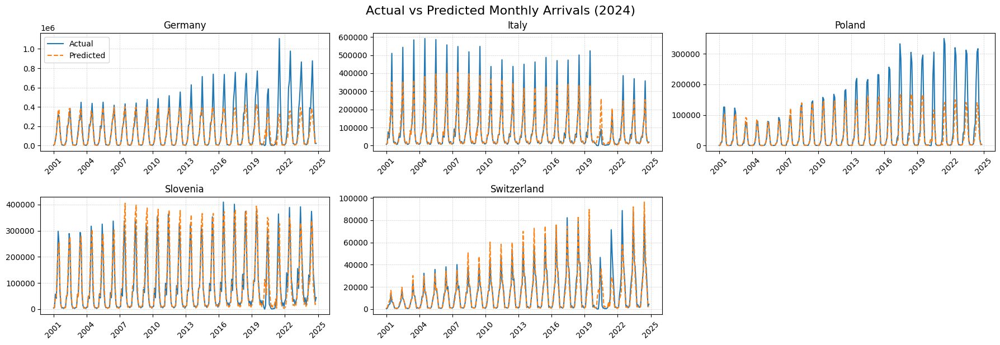

In [366]:
# Country-level plots
countries = df_plot['country'].unique()
fig, axes = plt.subplots(len(countries) // 3 + 1, 3, figsize=(18, 3 * (len(countries) // 3 + 1)), sharex=False, sharey=False)

axes = axes.flatten()

for i, country in enumerate(countries):
    country_df = df_plot[df_plot['country'] == country].groupby('date')[['actual', 'predicted']].sum()
    ax = axes[i]
    ax.plot(country_df.index, country_df['actual'], label='Actual')
    ax.plot(country_df.index, country_df['predicted'], label='Predicted', linestyle='--')
    ax.set_title(country)
    
    # Show x-axis ticks every 3 years
    ax.xaxis.set_major_locator(mdates.YearLocator(base=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)

    # Add legend only once
    if i == 0:
        ax.legend()

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
fig.suptitle('Actual vs Predicted Monthly Arrivals (2024)', fontsize=16, y=1.02)
plt.show()

In [367]:
# df_plot: DataFrame with columns ['country', 'date', 'actual', 'predicted']
# List of countries
countries = df_plot['country'].unique()

results = []

for country in countries:
    # Subset data for this country (test set only, if you want)
    country_df = df_plot[(df_plot['country'] == country) & (df_plot['date'] > val_end)]
    
    actual = country_df['actual'].values
    pred = country_df['predicted'].values
    
    if len(actual) == 0:
        continue  # Skip countries with no data in test set
    
    mse = round(mean_squared_error(actual, pred),6)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, pred)
    mape = mean_absolute_percentage_error(actual, pred)
    r2 = r2_score(actual, pred)
    
    results.append({
        'country': country,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape,
        'R2': r2
    })

# Convert to DataFrame for easy export or display
country_metrics = pd.DataFrame(results)
print(country_metrics)

       country           MSE           RMSE            MAE      MAPE        R2
0      Germany  5.353487e+10  231376.028628  139198.397871  0.511892  0.415365
1        Italy  1.070266e+09   32714.921875   15733.568666  0.368516  0.877356
2       Poland  7.211035e+09   84917.810718   50630.250026  0.458698  0.469374
3     Slovenia  2.133528e+09   46190.123747   34501.225409  0.574672  0.827616
4  Switzerland  1.087656e+08   10429.073923    6089.707087  0.318848  0.812500


# Subset of countries with overnights

In [370]:
# Load data
cool = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/df_top_cool.csv")
cool.replace('..', np.nan, inplace=True)
cool['date'] = pd.to_datetime(cool[['year', 'month']].assign(day=1))
cool = cool[~cool['country'].isin(['Russian Federation'])]

# Type conversions
cool['year'] = pd.to_numeric(cool['year'], downcast='integer', errors='coerce')
cool['month'] = pd.to_numeric(cool['month'], downcast='integer', errors='coerce')
cool['arrivals'] = pd.to_numeric(cool['arrivals'], errors='coerce')
cool['overnights'] = pd.to_numeric(cool['overnights'], errors='coerce')
cool['unemployment_rate'] = pd.to_numeric(cool['unemployment_rate'], errors='coerce')
cool['exchange_rate'] = pd.to_numeric(cool['exchange_rate'], errors='coerce')
cool['cpi'] = pd.to_numeric(cool['cpi'], errors='coerce')
cool['eu_member'] = cool['eu_member'].astype(int)

# Add Schengen and Euro info
schengen_entry_year = {
    'Austria': 1995, 'Belgium': 1995, 'Czech Republic': 2007, 'Denmark': 2001,
    'Finland': 1996, 'France': 1995, 'Germany': 1995, 'Hungary': 2007,
    'Italy': 1997, 'Netherlands': 1995, 'Norway': 2001, 'Poland': 2007,
    'Portugal': 1995, 'Slovakia': 2007, 'Slovenia': 2007, 'Spain': 1995,
    'Sweden': 2001, 'Switzerland': 2008, 'Romania': 2024,
}

cool['schengen_member'] = cool.apply(lambda row: int(row['year'] >= schengen_entry_year.get(row['country'], np.inf)), axis=1).astype('int8')

# Add Google Trends
td = pd.read_csv("C:/Users/Korisnik/Desktop/Škola/THESIS ideas/multiTimeline.csv")
td['date'] = pd.to_datetime(td['date']).dt.to_period('M').dt.to_timestamp()
td_long = td.melt(id_vars='date', var_name='country', value_name='google_trends')
cool['date'] = pd.to_datetime(cool['date']).dt.to_period('M').dt.to_timestamp()
cool = cool.merge(td_long, on=['date', 'country'], how='left')
cool['google_trends'] = cool['google_trends'].fillna(-1)

# Log transform + lags
cool = cool.sort_values(['country', 'date']).drop_duplicates(subset=['country', 'date']).reset_index(drop=True)
cool['arrivals'] = np.log1p(cool['arrivals'])
cool['overnights'] = np.log1p(cool['overnights'])
cool['exchange_rate'] = np.log1p(cool['exchange_rate'])
cool['cpi'] = np.log1p(cool['cpi'])

cool['overnights_next_month'] = cool.groupby('country')['arrivals'].shift(-1)

month_names = {
    1: 'January', 2: 'February', 3: 'March', 4: 'April',
    5: 'May', 6: 'June', 7: 'July', 8: 'August',
    9: 'September', 10: 'October', 11: 'November', 12: 'December'
}
cool['month_name'] = cool['month'].map(month_names)
ohe_month = pd.get_dummies(cool['month_name'], prefix='month').astype(int)
cool = pd.concat([cool.drop(columns=['month_name']), ohe_month], axis=1)

cool['overnights_lag_1'] = cool.groupby('country')['arrivals'].shift(1)
cool['overnights_lag_3'] = cool.groupby('country')['arrivals'].shift(3)
cool['overnights_lag_6'] = cool.groupby('country')['arrivals'].shift(6)
cool['overnights_lag_12'] = cool.groupby('country')['arrivals'].shift(12)
cool['cpi_lag_1'] = cool.groupby('country')['cpi'].shift(1)
cool['unemp_rate_lag_3'] = cool.groupby('country')['unemployment_rate'].shift(3)
cool['google_trends_lag_1'] = cool.groupby('country')['google_trends'].shift(1)
cool['google_trends_lag_3'] = cool.groupby('country')['google_trends'].shift(3)

cool = cool[cool['date'] >= '2001-01-01']
cool_sub2 = cool[cool['country'].isin(['Germany', 'Italy', 'Poland', 'Slovenia', 'Switzerland','USA'])].copy()
cool_sub2 = cool_sub2[cool_sub2['overnights_next_month'].notna()].copy()

cool_sub2['country_encoded'] = LabelEncoder().fit_transform(cool_sub2['country'])
month_cols = [col for col in cool_sub2.columns if col.startswith('month_')]

X_numeric = cool_sub2[[
    'unemp_rate_lag_3', 'exchange_rate', 'cpi_lag_1',
    'overnights_lag_1', 'overnights_lag_3', 'overnights_lag_6', 'overnights_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted'] + month_cols].values

X_country_array = cool_sub2['country_encoded'].astype('int32').values
y = cool_sub2['overnights_next_month'].values

train_end = pd.Timestamp("2016-12-31")
val_end = pd.Timestamp("2020-12-31")
train_mask = cool_sub2['date'] <= train_end
val_mask = (cool_sub2['date'] > train_end) & (cool_sub2['date'] <= val_end)
test_mask = cool_sub2['date'] > val_end

scaler = StandardScaler()
X_num_train = scaler.fit_transform(X_numeric[train_mask.to_numpy()])
X_num_val = scaler.transform(X_numeric[val_mask.to_numpy()])
X_num_test = scaler.transform(X_numeric[test_mask.to_numpy()])
X_numeric_scaled_all = scaler.transform(X_numeric)

X_cat_train = X_country_array[train_mask.to_numpy()]
X_cat_val = X_country_array[val_mask.to_numpy()]
X_cat_test = X_country_array[test_mask.to_numpy()]
y_train = y[train_mask.to_numpy()]
y_val = y[val_mask.to_numpy()]
y_test = y[test_mask.to_numpy()]


In [371]:

input_numeric = Input(shape=(X_num_train.shape[1],), name="numeric_input")
input_country = Input(shape=(1,), dtype='int32', name="country_input")
embedding = Embedding(input_dim=len(np.unique(X_country_array)), output_dim=6)(input_country)
embedding_flat = Flatten()(embedding)
x = Concatenate()([input_numeric, embedding_flat])
x = Dense(64, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
x = Dense(32, activation='tanh')(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)
output = Dense(1)(x)

model0 = Model(inputs=[input_numeric, input_country], outputs=output)
model0.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

early_stop = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)
history = model0.fit(
    [X_num_train, X_cat_train], y_train,
    validation_data=([X_num_val, X_cat_val], y_val),
    epochs=100, batch_size=16)

model0.summary()


Epoch 1/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 96.2673 - val_loss: 83.4533
Epoch 2/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 82.6436 - val_loss: 67.1095
Epoch 3/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 67.3150 - val_loss: 48.3680
Epoch 4/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 49.8187 - val_loss: 32.1284
Epoch 5/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 30.1898 - val_loss: 14.7346
Epoch 6/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 15.6023 - val_loss: 6.2273
Epoch 7/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.5336 - val_loss: 3.6870
Epoch 8/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 4.6136 - val_loss: 2.5168
Epoch 9/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 4.1666 - val_loss: 2.2894
Epoch 10/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.6290 - val_loss: 2.3527
Epoch 11/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.4119 - val_loss: 2.3391
Epoch 12/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 4s 

Model: "functional_42"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ country_input       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_42        │ (None, 1, 6)      │         36 │ country_input[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ numeric_input       │ (None, 25)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_42          │ (None, 6)         │          0 │ embedding_42[0][… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_42      │ (None, 31)        │          0 │ numeric_input[0]… │
│ (Concatenate)       │                   │            │ flatten_42[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_126 (Dense)   │ (None, 64)        │      2,048 │ concatenate_42[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_126[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_84          │ (None, 64)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_127 (Dense)   │ (None, 32)        │      2,080 │ dropout_84[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32)        │        128 │ dense_127[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_85          │ (None, 32)        │          0 │ batch_normalizat… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_128 (Dense)   │ (None, 1)         │         33 │ dropout_85[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 13,361 (52.20 KB)

 Trainable params: 4,389 (17.14 KB)

 Non-trainable params: 192 (768.00 B)

 Optimizer params: 8,780 (34.30 KB)

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
9/9 ━━━━━━

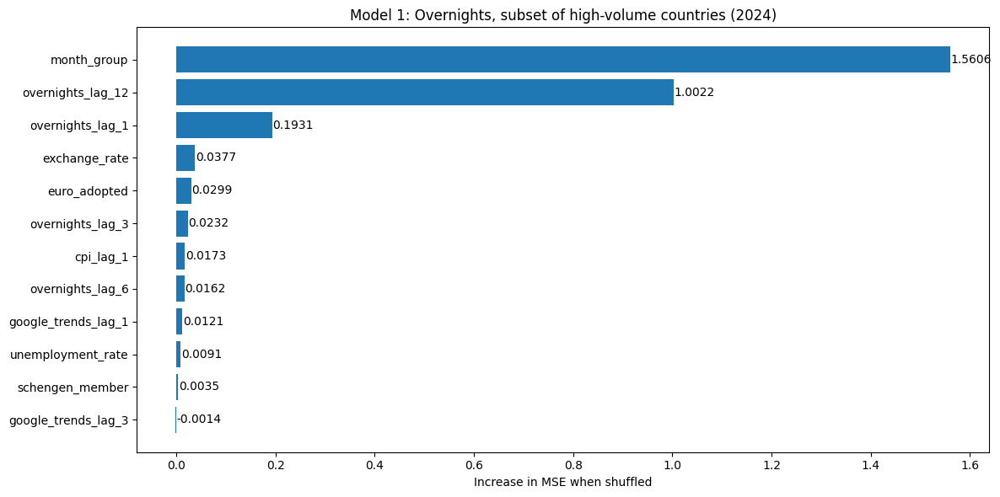

In [372]:
# Baseline predictions
baseline_preds = model0.predict([X_num_test, X_cat_test]).flatten()
baseline_mse = mean_squared_error(y_test, baseline_preds)

feature_names = [
    'unemployment_rate', 'exchange_rate', 'cpi_lag_1',
    'overnights_lag_1', 'overnights_lag_3', 'overnights_lag_6', 'overnights_lag_12',
    'google_trends_lag_1', 'google_trends_lag_3', 'schengen_member', 'euro_adopted']+month_cols

importances = []
for i in range(X_num_test.shape[1]):
    X_permuted = X_num_test.copy()
    X_permuted[:, i] = np.random.permutation(X_permuted[:, i])
    permuted_preds = model0.predict([X_permuted, X_cat_test]).flatten()
    permuted_mse = mean_squared_error(y_test, permuted_preds)
    importances.append(permuted_mse - baseline_mse)

#Handle grouped month dummies so its not one bar for each month
month_indices = [i for i, f in enumerate(feature_names) if f.startswith('month_')]

if month_indices:
    # Safe grouped permutation
    X_month_permuted = X_num_test.copy()
    row_perm = np.random.permutation(len(X_month_permuted))
    X_month_permuted[:, month_indices] = X_month_permuted[row_perm][:, month_indices]
    month_preds = model0.predict([X_month_permuted, X_cat_test]).flatten()
    month_importance = mean_squared_error(y_test, month_preds) - baseline_mse
else:
    month_importance = 0  # fallback if no month cols present

filtered_names = [f for i, f in enumerate(feature_names) if i not in month_indices]
filtered_importances = [imp for i, imp in enumerate(importances) if i not in month_indices]
feature_names_final = filtered_names + ['month_group']
importances_final = filtered_importances + [month_importance]
sorted_pairs = sorted(zip(importances_final, feature_names_final), reverse=True)
importances_sorted, feature_names_sorted = zip(*sorted_pairs)

plt.figure(figsize=(12, 6))
bars = plt.barh(feature_names_sorted, importances_sorted)
plt.xlabel("Increase in MSE when shuffled")
plt.title("Model 1: Overnights, subset of high-volume countries (2024)")
plt.gca().invert_yaxis()

# Add labels
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.001, bar.get_y() + bar.get_height() / 2,
             f"{width:.4f}", va='center')

plt.tight_layout()
plt.show()

## Model Evaluation

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Train MSE: 0.0881, RMSE: 0.2968, MAE: 0.2366, MAPE: 0.0257, R²: 0.9726
Test MSE: 0.4140, RMSE: 0.6434, MAE: 0.4859, MAPE: 0.0480, R²: 0.8591


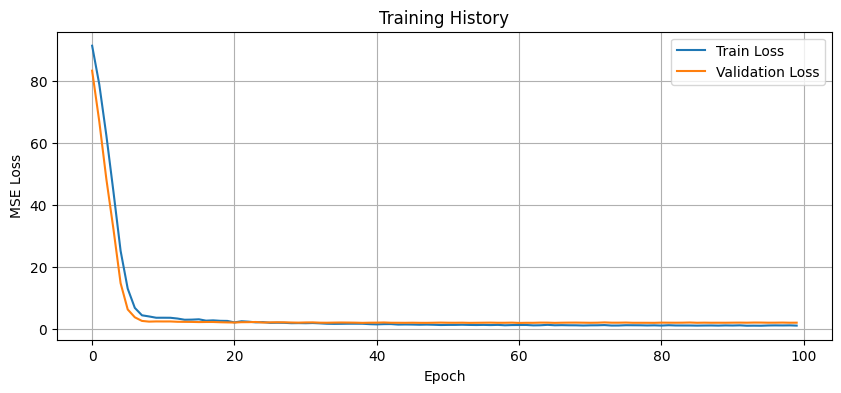

In [373]:
## Model evalauation
# Predict and flatten
train_preds = model0.predict([X_num_train, X_cat_train]).flatten()
test_preds = model0.predict([X_num_test, X_cat_test]).flatten()

# MSE
train_mse = mean_squared_error(y_train, train_preds)
test_mse = mean_squared_error(y_test, test_preds)

# RMSE
train_rmse0 = np.sqrt(train_mse)
test_rmse0 = np.sqrt(test_mse)

#MAE
train_mae0 = mean_absolute_error(y_train, train_preds)
test_mae0 = mean_absolute_error(y_test, test_preds)

# MAPE
train_mape0 = mean_absolute_percentage_error(y_train, train_preds)
test_mape0 = mean_absolute_percentage_error(y_test, test_preds)

# R-squared
train_r2_0 = r2_score(y_train, train_preds)
test_r2_0 = r2_score(y_test, test_preds)

# Print all metrics
print(f"Train MSE: {train_mse:.4f}, RMSE: {train_rmse0:.4f}, MAE: {train_mae0:.4f}, MAPE: {train_mape0:.4f}, R²: {train_r2_0:.4f}")
print(f"Test MSE: {test_mse:.4f}, RMSE: {test_rmse0:.4f}, MAE: {test_mae0:.4f}, MAPE: {test_mape0:.4f}, R²: {test_r2_0:.4f}")

# Plot training history
plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training History')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True)
plt.show()

54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


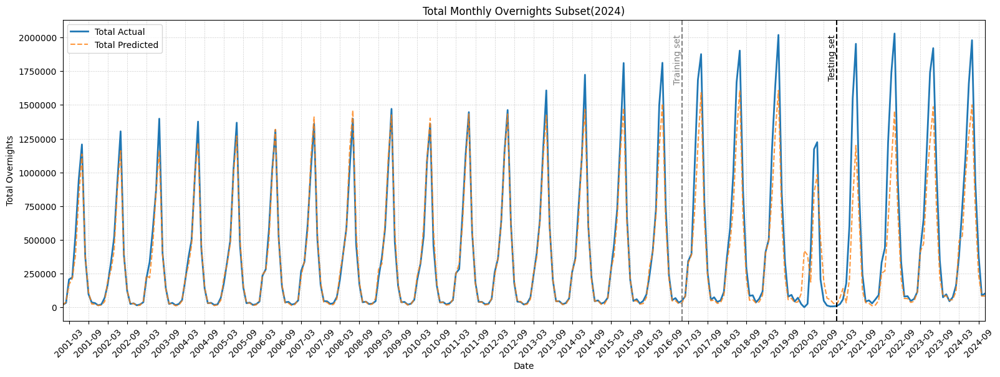

In [374]:
# Global trend plot (total actual vs predicted per month)

y_pred_all = model0.predict([X_numeric_scaled_all, X_country_array]).flatten()
y_actual_all = np.expm1(y)
y_pred_all = np.expm1(y_pred_all)
df_plot = cool_sub2.copy()
df_plot['actual'] = y_actual_all
df_plot['predicted'] = y_pred_all
monthly_totals_all = df_plot.groupby('date')[['actual', 'predicted']].sum()

plt.figure(figsize=(16, 6))
plt.plot(monthly_totals_all.index, monthly_totals_all['actual'], label='Total Actual', linewidth=2)
plt.plot(monthly_totals_all.index, monthly_totals_all['predicted'], label='Total Predicted', linestyle='--', alpha=0.8)
plt.title("Total Monthly Overnights Subset(2024)")
plt.xlabel("Date")
plt.ylabel("Total Overnights")
plt.xticks(rotation=90)
plt.ticklabel_format(style='plain', axis='y')
plt.legend()
plt.tight_layout()
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.xlim(monthly_totals_all.index.min(), monthly_totals_all.index.max())
plt.axvline(x=train_end, color='gray', linestyle='--', linewidth=1.5, label='Train/Val Split')
plt.axvline(x=val_end, color='black', linestyle='--', linewidth=1.5, label='Val/Test Split')
plt.text(train_end, plt.ylim()[1]*0.95, 'Training set', rotation=90, ha='right', va='top', color='gray')
plt.text(val_end, plt.ylim()[1]*0.95, 'Testing set', rotation=90, ha='right', va='top', color='black')
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)
plt.show()

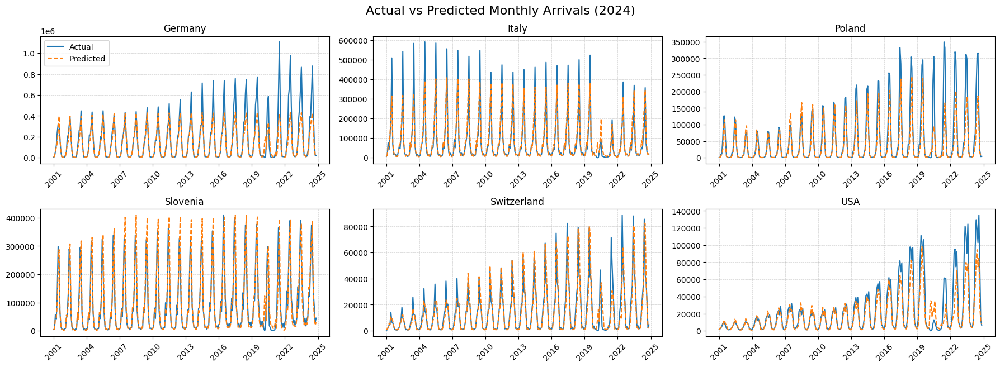

In [375]:
# Country-level plots
countries = df_plot['country'].unique()
fig, axes = plt.subplots(len(countries) // 3 + 1, 3, figsize=(18, 3 * (len(countries) // 3 + 1)), sharex=False, sharey=False)

axes = axes.flatten()

for i, country in enumerate(countries):
    country_df = df_plot[df_plot['country'] == country].groupby('date')[['actual', 'predicted']].sum()
    ax = axes[i]
    ax.plot(country_df.index, country_df['actual'], label='Actual')
    ax.plot(country_df.index, country_df['predicted'], label='Predicted', linestyle='--')
    ax.set_title(country)
    
    # Show x-axis ticks every 3 years
    ax.xaxis.set_major_locator(mdates.YearLocator(base=3))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)

    # Add legend only once
    if i == 0:
        ax.legend()

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.tight_layout()
fig.suptitle('Actual vs Predicted Monthly Arrivals (2024)', fontsize=16, y=1.02)
plt.show()

In [376]:
# df_plot: DataFrame with columns ['country', 'date', 'actual', 'predicted']
# List of countries
countries = df_plot['country'].unique()

results = []

for country in countries:
    # Subset data for this country (test set only, if you want)
    country_df = df_plot[(df_plot['country'] == country) & (df_plot['date'] > val_end)]
    
    actual = country_df['actual'].values
    pred = country_df['predicted'].values
    
    if len(actual) == 0:
        continue  # Skip countries with no data in test set
    
    mse = round(mean_squared_error(actual, pred),6)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, pred)
    mape = mean_absolute_percentage_error(actual, pred)
    r2 = r2_score(actual, pred)
    
    results.append({
        'country': country,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape,
        'R2': r2
    })

# Convert to DataFrame for easy export or display
country_metrics = pd.DataFrame(results)
print(country_metrics)

       country           MSE           RMSE            MAE      MAPE        R2
0      Germany  4.024194e+10  200603.944104  121130.643923  0.450907  0.560532
1        Italy  7.848145e+08   28014.540743   16760.034107  0.388984  0.910066
2       Poland  5.813232e+09   76244.554155   43257.363849  0.408261  0.572232
3     Slovenia  3.027006e+09   55018.231569   37428.719706  0.524595  0.755425
4  Switzerland  1.977036e+08   14060.710910    7427.436933  0.330616  0.659180
5          USA  8.089627e+08   28442.269892   19675.270503  0.460863  0.580131
